In [1]:
import scprep
import numpy as np
import pickle
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import scanpy as sc
import sklearn
import phate
import seaborn as sns
import pandas as pd
import scipy
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import tensorflow_probability as tfp

Instructions for updating:
non-resource variables are not supported in the long term


# Preprocess spatial expression matrix (one-time exec)

In [24]:
# load spatial data
file = open('/data/lab/datasets/Anndata/All_data_experiment_all_ChrCha_Spatial_anndata_list.pkl', 'rb')
spatial_data = pickle.load(file)
file.close()
s5 = spatial_data[0]  # explore s6-s8 later

# Get expression matrix
spatial_expmat = s5.X.toarray()
print(spatial_expmat.shape)

(1415, 64591)


In [ ]:
# filter out unexpressed genes and mouse genes
expressed_genes = np.where(np.sum(spatial_expmat, axis=0) > 0)[0]
human_ind_spatial = np.where(s5.var.genome == 'GRCh38')[0]
spatial_expmat = spatial_expmat[:, np.intersect1d(expressed_genes, human_ind_spatial)]   # shape is now (1415, 19110)

# sanity check
print(spatial_expmat.shape)

# normalize by cell
spatial_expmat = scprep.normalize.library_size_normalize(spatial_expmat, rescale=1000)
# rowsums = np.sum(spatial_expmat, axis=1)
# spatial_expmat = 1000 * spatial_expmat / np.reshape(rowsums, (spatial_expmat.shape[0], 1))

# sqrt transform
spatial_expmat = scprep.transform.sqrt(spatial_expmat)

# mean center
spatial_expmat = scprep.normalize.batch_mean_center(spatial_expmat)
# spatial_means = np.mean(spatial_expmat, axis=0)
# spatial_expmat -= spatial_means

# sanity check
print(np.mean(np.sum(spatial_expmat, axis=0)))

In [ ]:
np.savez_compressed('/home/anniegao/spatial_magan/data/spatial_expmat', spatial_expmat)

In [ ]:
spatial_phate_op = phate.PHATE()
spatial_phate = spatial_phate_op.fit_transform(spatial_expmat)
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False)

In [ ]:
spatial_phate_clusters = phate.cluster.kmeans(spatial_phate_op, n_clusters=3)
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False, c=spatial_phate_clusters)

In [ ]:
np.savez_compressed('/home/anniegao/spatial_magan/data/spatial_cluster_3_labels_phate', spatial_phate_clusters)

In [ ]:
# # get spectral cluster labels
# cluster_spatial = sklearn.cluster.SpectralClustering()
# cluster_spatial.fit(spatial_expmat)

In [ ]:
# print('Assigned to {} clusters'.format(len(set(cluster_spatial.labels_))))
# print(cluster_spatial.labels_.shape)
# print(cluster_spatial.affinity_matrix_.shape)
# np.savez_compressed('/data/anniegao/spatial_magan/spatial_cluster_labels', cluster_spatial.labels_)
# np.savez_compressed('/data/anniegao/spatial_magan/spatial_cluster_affinities', cluster_spatial.affinity_matrix_)

In [ ]:
# perform pca
spatial_pca = sklearn.decomposition.PCA()
spatial_pca.fit(spatial_expmat)

In [ ]:
# save first 100 components for later reconstruction
np.savez_compressed('/home/anniegao/spatial_magan/data/spatial_pca_100components', spatial_pca.components_[:100, :])

In [ ]:
pcs = 100
while pcs <= 1000:
    print('{} PCs: {} variance'.format(pcs, np.sum(spatial_pca.explained_variance_ratio_[:pcs])))
    pcs += 50

In [ ]:
spatial_reduced = spatial_expmat @ spatial_pca.components_[:100, :].T
print(spatial_reduced.shape)

In [ ]:
spatial_reduced

In [ ]:
np.savez_compressed('/home/anniegao/spatial_magan/data/spatial_pca', spatial_reduced)

In [23]:
spatial_pca = np.load('/home/anniegao/spatial_magan/data/spatial_pca.npz')['arr_0']

In [25]:
# appending spatial coordinates as last 2 columns of spatial_pca
coords = s5.obs[['array_row', 'array_col']]
coords.shape

(1415, 2)

In [26]:
spatial_pca_with_coords = np.append(spatial_pca, coords, axis=1)
print(spatial_pca_with_coords.shape)

(1415, 102)


In [27]:
spatial_pca_with_coords[:,100] -= np.mean(spatial_pca_with_coords[:,100])
spatial_pca_with_coords[:,101] -= np.mean(spatial_pca_with_coords[:,101])

In [28]:
spatial_pca_with_coords[:,100:] *= 0.01

In [31]:
spatial_pca_with_coords[:5, 100:]

array([[ 0.103,  0.246],
       [-0.047,  0.016],
       [ 0.263, -0.074],
       [ 0.053, -0.104],
       [ 0.153, -0.224]])

In [29]:
np.savez_compressed('/home/anniegao/spatial_magan/data/spatial_pca_with_coords', spatial_pca_with_coords)

# Preprocess RNA seq expression matrix (one-time exec)

In [ ]:
# load rna seq data
rna = sc.read('/home/anniegao/Raw_experiment_all_unfiltered_counts_AnnData.h5ad')

# Get expression matrix
rna_expmat = rna.X.toarray()
print(rna_expmat.shape)

In [ ]:
set(rna.obs.Sample)

In [ ]:
# only use primary tissue samples
primary_tissue = np.where(rna.obs.Sample.str.startswith('Primary_'))[0]

# Filter out mouse genes (verified that human_ind_spatial == human_ind_rna)
human_ind_rna = np.where(rna.var.Organism == 'GRCh38')[0]
expressed_genes = np.where(np.sum(rna_expmat, axis=0) > 0)[0]

rna_expmat = rna_expmat[primary_tissue,:]
rna_expmat = rna_expmat[:,np.intersect1d(human_ind_rna, expressed_genes)]

# sanity check
print(rna_expmat.shape)

In [ ]:
# Normalize by cell
rna_expmat = scprep.normalize.library_size_normalize(rna_expmat, rescale=1000)

# Sqrt transform
rna_expmat = scprep.transform.sqrt(rna_expmat)

# Mean centering
rna_expmat = scprep.normalize.batch_mean_center(rna_expmat)

# sanity check
print(np.mean(np.sum(rna_expmat, axis=0)))

In [ ]:
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_expmat', rna_expmat)

In [ ]:
# get phate clusters
rna_phate_op = phate.PHATE()
rna_phate = rna_phate_op.fit_transform(rna_expmat)
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False)

In [ ]:
# density-sampled
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False)

In [ ]:
rna_phate_clusters = phate.cluster.kmeans(rna_phate_op, n_clusters=5)
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False, c=rna_phate_clusters)

In [ ]:
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_cluster_5_labels_phate', rna_phate_clusters)

In [ ]:
# get spectral cluster labels
# cluster_rna = sklearn.cluster.SpectralClustering()
# cluster_rna.fit(rna_expmat)
# print('Assigned to {} clusters'.format(len(set(cluster_rna.labels_))))
# print(cluster_rna.labels_.shape)
# print(cluster_rna.affinity_matrix_.shape)
# np.savez_compressed('/data/anniegao/spatial_magan/rna_cluster_labels', cluster_rna.labels_)
# np.savez_compressed('/data/anniegao/spatial_magan/rna_cluster_affinities', cluster_rna.affinity_matrix_)

In [ ]:
# perform pca
rna_pca = sklearn.decomposition.PCA()
rna_pca.fit(rna_expmat)

In [ ]:
# save first 100 components for later reconstruction
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_pca_100components', rna_pca.components_[:100, :])

In [ ]:
pcs = 100
while pcs <= 1000:
    print('{} PCs: {} variance'.format(pcs, np.sum(rna_pca.explained_variance_ratio_[:pcs])))
    pcs += 50

In [ ]:
rna_reduced = rna_expmat @ rna_pca.components_[:100, :].T
print(rna_reduced.shape)

In [ ]:
rna_reduced

In [ ]:
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_pca', rna_reduced)

In [16]:
kde = scipy.stats.gaussian_kde(rna_pca_full.T)
# Choice probabilities are computed from inverse probability density in KDE
p = 1 - kde.pdf(rna_pca_full.T)
# Normalize choice probabilities
p /= np.sum(p)
# Make sample using choice probabilities
idx = np.random.choice(np.arange(rna_pca_full.shape[0]), size=1415, replace=False, p=p)
rna_sample = rna_pca_full[idx,:]

In [20]:
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_idx_sample', idx)

In [25]:
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_idx_sample_OLD', rna_idx_sample)

In [21]:
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_pca_sampled', rna_sample)

In [27]:
rna_clusters_sampled = rna_cluster_labels[idx]
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_cluster_5_labels_sampled', rna_clusters_sampled)

In [24]:
rna_pcs.shape

(100, 26662)

<AxesSubplot:>

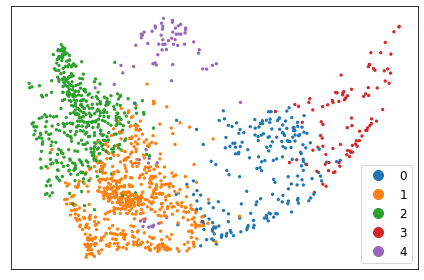

In [29]:
rna_phate_op = phate.PHATE(verbose=0)
rna_phate = rna_phate_op.fit_transform(rna_sample)
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False, c=rna_clusters_sampled)

In [18]:
rna_idx_sample = np.load('/home/anniegao/spatial_magan/data/rna_idx_sample.npz')['arr_0']

<AxesSubplot:>

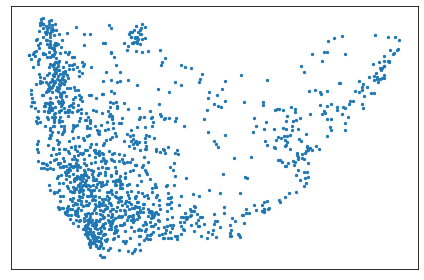

In [19]:
og_sample = rna_pca_full[rna_idx_sample,:]
rna_phate_op = phate.PHATE(verbose=0)
rna_phate = rna_phate_op.fit_transform(og_sample)
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False)

In [ ]:
rna_pca = np.load('/home/anniegao/spatial_magan/data/rna_pca_sampled.npz')['arr_0']

In [41]:
rna_expmat = rna_expmat[idx,:]
np.savez_compressed('/home/anniegao/spatial_magan/data/rna_expmat_sampled', rna_expmat)

# Load preprocessed matrices

In [2]:
spatial_expmat = np.load('/home/anniegao/spatial_magan/data/spatial_expmat.npz')['arr_0']
print(spatial_expmat.shape)

(1415, 19110)


In [57]:
rna_expmat = np.load('/home/anniegao/spatial_magan/data/rna_expmat.npz')['arr_0']
# rna_expmat = np.load('/home/anniegao/spatial_magan/data/rna_expmat_sampled.npz')['arr_0']
print(rna_expmat.shape)

(33938, 26662)


In [4]:
# spatial_pca = np.load('/home/anniegao/spatial_magan/data/spatial_pca.npz')['arr_0']
spatial_pca = np.load('/home/anniegao/spatial_magan/data/spatial_pca_with_coords.npz')['arr_0']
rna_pca = np.load('/home/anniegao/spatial_magan/data/rna_pca_sampled.npz')['arr_0']
spatial_cluster_labels = np.load('/home/anniegao/spatial_magan/data/spatial_cluster_3_labels_phate.npz')['arr_0']
rna_cluster_labels = np.load('/home/anniegao/spatial_magan/data/rna_cluster_5_labels_sampled.npz')['arr_0']

In [50]:
rna_pca_full = np.load('/home/anniegao/spatial_magan/data/rna_pca.npz')['arr_0']
rna_cluster_labels_full = np.load('/home/anniegao/spatial_magan/data/rna_cluster_5_labels_phate.npz')['arr_0']

In [5]:
spatial_pcs = np.load('/home/anniegao/spatial_magan/data/spatial_pca_100components.npz')['arr_0']
rna_pcs = np.load('/home/anniegao/spatial_magan/data/rna_pca_100components.npz')['arr_0']

# View MAGAN resuls plots

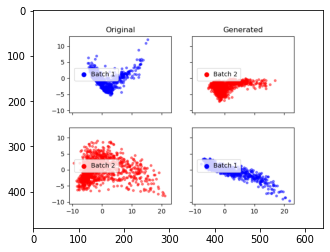

In [6]:
imgplot = plt.imshow(mpimg.imread('MAGAN/MAGAN/model2/plots/plot_500.png'))
plt.show()

In [ ]:
imgplot = plt.imshow(mpimg.imread('MAGAN/MAGAN/model2/plots/plot_99500.png'))
plt.show()

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(12,12))
axes[0,0].imshow(mpimg.imread('MAGAN/MAGAN/model8/plots/plot_10000.png'))
axes[0,1].imshow(mpimg.imread('MAGAN/MAGAN/model8/plots/plot_2000.png'))
axes[1,0].imshow(mpimg.imread('MAGAN/MAGAN/model8/plots/plot_8000.png'))
axes[1,1].imshow(mpimg.imread('MAGAN/MAGAN/model8/plots/plot_24500.png'))
axes[0,0].set_title('5000 Iterations')
axes[0,1].set_title('10000 Iterations')
axes[1,0].set_title('15000 Iterations')
axes[1,1].set_title('20000 Iterations')

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(12,12))
axes[0,0].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_8000.png'))
axes[0,1].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_9000.png'))
axes[1,0].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_11000.png'))
axes[1,1].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_12000.png'))
axes[0,0].set_title('8000 Iterations')
axes[0,1].set_title('9000 Iterations')
axes[1,0].set_title('11000 Iterations')
axes[1,1].set_title('12000 Iterations')

In [ ]:
fig, axes = plt.subplots(2,2,figsize=(12,12))
axes[0,0].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_25000.png'))
axes[0,1].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_50000.png'))
axes[1,0].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_75000.png'))
axes[1,1].imshow(mpimg.imread('MAGAN/MAGAN/model3/plots/plot_95000.png'))
axes[0,0].set_title('25000 Iterations')
axes[0,1].set_title('50000 Iterations')
axes[1,0].set_title('75000 Iterations')
axes[1,1].set_title('99500 Iterations')

# Load trained MAGAN model

In [6]:
import sys
import os
sys.path.append(os.path.join(os.getcwd(), 'MAGAN/MAGAN'))
from model import MAGAN

In [70]:
magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model16')

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model16/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model16


In [71]:
rna_to_spatial = magan.get_layer(spatial_pca, rna_pca, 'Gb1')  # 2->1
spatial_to_rna = magan.get_layer(spatial_pca, rna_pca, 'Gb2')  # 1->2

In [72]:
print(rna_to_spatial.shape)
print(spatial_to_rna.shape)

(1415, 102)
(1415, 100)


In [7]:
phate_op = phate.PHATE(verbose=0)
spatial_phate = phate_op.fit_transform(spatial_pca[:,:100])
# rna_to_spatial_phate = phate_op.fit_transform(rna_to_spatial)
rna_phate = phate_op.fit_transform(rna_pca)
# spatial_to_rna_phate = phate_op.fit_transform(spatial_to_rna)

In [58]:
# se = phate_op.fit_transform(spatial_expmat)
re = phate_op.fit_transform(rna_expmat)
# rna_phate_full = phate_op.fit_transform(rna_pca_full)

In [56]:
rna_phate_full.shape

(33938, 2)

In [54]:
rna_cluster_labels_full.shape

(33938,)

Text(0.5, 1.0, 'RNA Data PCA Reconstruction')

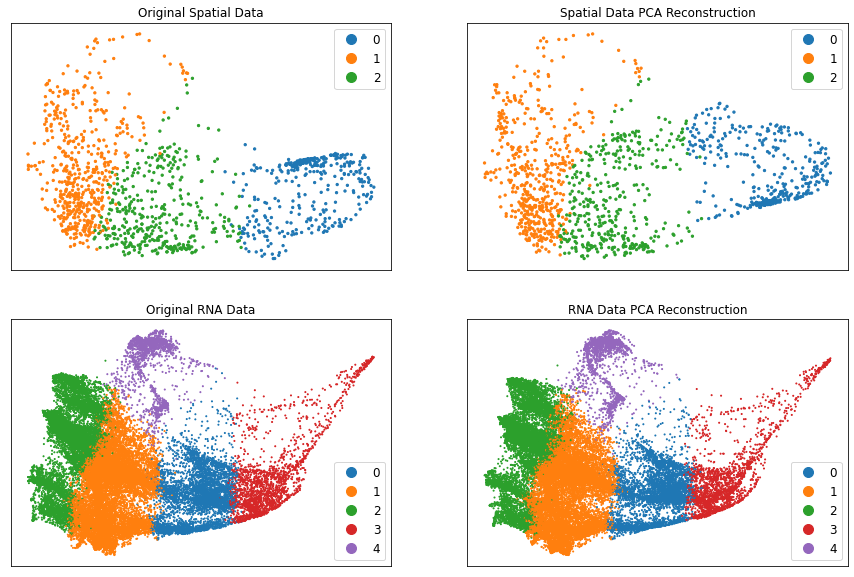

In [59]:
fig, axes = plt.subplots(2,2, figsize=(15,10))
scprep.plot.scatter2d(se, fontsize=10, ticks=False, ax=axes[0,0], c=spatial_cluster_labels)
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False, ax=axes[0,1], c=spatial_cluster_labels)
scprep.plot.scatter2d(re, fontsize=10, ticks=False, ax=axes[1,0], c=rna_cluster_labels_full)
scprep.plot.scatter2d(rna_phate_full, fontsize=10, ticks=False, ax=axes[1,1], c=rna_cluster_labels_full)
axes[0,0].set_title('Original Spatial Data')
axes[0,1].set_title('Spatial Data PCA Reconstruction')
axes[1,0].set_title('Original RNA Data')
axes[1,1].set_title('RNA Data PCA Reconstruction')

In [8]:
def analyze_results(model_num, magan_viz_iters, phate_op=phate.PHATE(verbose=0)):
    magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model{}'.format(model_num))
    rna_to_spatial = magan.get_layer(spatial_pca, rna_pca, 'Gb1')[:,:100]  # 2->1
    spatial_to_rna = magan.get_layer(spatial_pca, rna_pca, 'Gb2')  # 1->2
    
    # visualize magan plots
    fig, axes = plt.subplots(2,2,figsize=(20,20))
    axes[0,0].imshow(mpimg.imread('MAGAN/MAGAN/model{}/plots/plot_{}.png'.format(model_num, magan_viz_iters[0])))
    axes[0,1].imshow(mpimg.imread('MAGAN/MAGAN/model{}/plots/plot_{}.png'.format(model_num, magan_viz_iters[1])))
    axes[1,0].imshow(mpimg.imread('MAGAN/MAGAN/model{}/plots/plot_{}.png'.format(model_num, magan_viz_iters[2])))
    axes[1,1].imshow(mpimg.imread('MAGAN/MAGAN/model{}/plots/plot_{}.png'.format(model_num,magan_viz_iters[3])))
    axes[0,0].set_title('{} Iterations'.format(magan_viz_iters[0]))
    axes[0,1].set_title('{} Iterations'.format(magan_viz_iters[1]))
    axes[1,0].set_title('{} Iterations'.format(magan_viz_iters[2]))
    axes[1,1].set_title('{} Iterations'.format(magan_viz_iters[3]))
    plt.show()

    # gen kde plots
    column_names = ['c1','c2','c3','c4','c5']
    spatial_df = pd.DataFrame(data=spatial_pca[:,:5], columns=column_names)
    rna_to_spatial_df = pd.DataFrame(data=rna_to_spatial[:,:5], columns = column_names)
    rna_df = pd.DataFrame(data=rna_pca[:,:5], columns=column_names)
    spatial_to_rna_df = pd.DataFrame(data=spatial_to_rna[:,:5], columns=column_names)
    fig, axes = plt.subplots(2, 2, figsize=(10,10))
    for i in range(5):
        sns.kdeplot(data=spatial_df['c{}'.format(i+1)], ax=axes[0,0])
        sns.kdeplot(data=rna_to_spatial_df['c{}'.format(i+1)], ax=axes[0,1])
        sns.kdeplot(data=rna_df['c{}'.format(i+1)], ax=axes[1,0])
        sns.kdeplot(data=spatial_to_rna_df['c{}'.format(i+1)], ax=axes[1,1])
    for i in range(2):
        for j in range(2):
            axes[i,j].set_xlabel('Data')
            axes[i,j].set_ylabel('Density')
            axes[i,j].set_xlim(left=-10, right=10)
    axes[0,0].set_title('Spatial PCA Density')
    axes[0,1].set_title('RNA->Spatial Density')
    axes[1,0].set_title('RNA PCA Density')
    axes[1,1].set_title('Spatial->RNA PCA Density')
    plt.show()
    
    # gen phate plots
    rna_to_spatial_phate = phate_op.fit_transform(rna_to_spatial)
    spatial_to_rna_phate = phate_op.fit_transform(spatial_to_rna)
    fig, axes = plt.subplots(2,2, figsize=(15,10))
    scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False, ax=axes[0,0], c=spatial_cluster_labels)
    scprep.plot.scatter2d(rna_to_spatial_phate, fontsize=10, ticks=False, ax=axes[0,1], c=rna_cluster_labels)
    scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False, ax=axes[1,0], c=rna_cluster_labels)
    scprep.plot.scatter2d(spatial_to_rna_phate, fontsize=10, ticks=False, ax=axes[1,1], c=spatial_cluster_labels)
    axes[0,0].set_title('Original Spatial Data')
    axes[0,1].set_title('Generated RNA->Spatial Data')
    axes[1,0].set_title('Original RNA Data')
    axes[1,1].set_title('Generated Spatial->RNA Data')
    plt.show()

In [9]:
def print_correlations(model_num, num_sig_genes):
    magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model{}'.format(model_num))
    rna_to_spatial = magan.get_layer(spatial_pca, rna_pca, 'Gb1')[:,:100]  # 2->1
    spatial_to_rna = magan.get_layer(spatial_pca, rna_pca, 'Gb2')  # 1->2
    
    spatial_recon = rna_to_spatial @ spatial_pcs
    rna_recon = spatial_to_rna @ rna_pcs
    spatial_corr = spatial_to_rna @ spatial_pcs
    rna_corr = rna_to_spatial @ rna_pcs
    spatial_sig_genes = scprep.stats.differential_expression_by_cluster(spatial_expmat, spatial_cluster_labels)
    rna_sig_genes = scprep.stats.differential_expression_by_cluster(rna_expmat, rna_cluster_labels)
    print('Correlations using top {} significant genes'.format(num_sig_genes))
    
    spatial_corrs_cell = []
    spatial_corrs_gene = []
    for i in range(3):
        top_20_spatial = spatial_sig_genes[i].index[:num_sig_genes]
        s1 = spatial_expmat[:,top_20_spatial]
        s2 = spatial_corr[:,top_20_spatial]
        corr_cell = tfp.stats.correlation(s1, s2, sample_axis=1, event_axis=None)
        corr_cell_arr = corr_cell.eval(session=tf.compat.v1.Session())
        corr_gene = tfp.stats.correlation(s1, s2, sample_axis=0, event_axis=None)
        corr_gene_arr = corr_gene.eval(session=tf.compat.v1.Session())
        spatial_corrs_cell.append(np.mean(np.abs(corr_cell_arr)))
        spatial_corrs_gene.append(np.mean(np.abs(corr_gene_arr)))
    print('Correlations by cluster by cell')
    print(spatial_corrs_cell)
    print('Correlations by cluster by gene')
    print(spatial_corrs_gene)
    
    rna_corrs_cell = []
    rna_corrs_gene = []
    for i in range(5):
        top_20_rna = rna_sig_genes[i].index[:num_sig_genes]
        s1 = rna_expmat[:,top_20_rna]
        s2 = rna_corr[:,top_20_rna]
        corr_cell = tfp.stats.correlation(s1, s2, sample_axis=1, event_axis=None)
        corr_cell_arr = corr_cell.eval(session=tf.compat.v1.Session())
        corr_gene = tfp.stats.correlation(s1, s2, sample_axis=0, event_axis=None)
        corr_gene_arr = corr_gene.eval(session=tf.compat.v1.Session())
        rna_corrs_cell.append(np.mean(np.abs(corr_cell_arr)))
        rna_corrs_gene.append(np.mean(np.abs(corr_gene_arr)))
    print('Correlations by cluster by cell')
    print(rna_corrs_cell)
    print('Correlations by cluster by gene')
    print(rna_corrs_gene)

In [40]:
def plot_spatial_coords(model_num, scale=5, other_models=[]):
    magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model{}'.format(model_num))
    fig, ax = plt.subplots(2, 3, figsize=(18,12))
    spatial_scaled = np.copy(spatial_pca)
    spatial_scaled[:,100:] *= scale
    scprep.plot.scatter(spatial_scaled[:,100], spatial_scaled[:,101], c=spatial_cluster_labels, ax=ax[0,0])
    sns.kdeplot(spatial_scaled[:,100], spatial_scaled[:,101], ax=ax[1,0])

    spatial_to_rna = magan.get_layer(spatial_scaled, rna_pca, 'Gb2')
    rna_to_spatial = magan.get_layer(spatial_scaled, rna_pca, 'Gb1')
    spatial_recon = magan.get_layer(spatial_scaled, spatial_to_rna, 'Gb1')
    for model_num1 in other_models:
        magan1 = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model{}'.format(model_num1))
        s2r_tmp = magan1.get_layer(spatial_scaled, rna_pca, 'Gb2')
        spatial_to_rna += s2r_tmp
        rna_to_spatial += magan1.get_layer(spatial_scaled, rna_pca, 'Gb1')
        spatial_recon += magan1.get_layer(spatial_scaled, s2r_tmp, 'Gb1')
    spatial_to_rna /= (1 + len(other_models))
    rna_to_spatial /= (1 + len(other_models))
    spatial_recon /= (1 + len(other_models))
    
#     magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model{}'.format(model_num))
#     spatial_recon = magan.get_layer(spatial_scaled, spatial_to_rna, 'Gb1')
#     for model_num1 in other_models:
#         magan1 = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model{}'.format(model_num1))
#         spatial_recon += magan1.get_layer(spatial_scaled, spatial_to_rna, 'Gb1')
#     spatial_recon /= (1 + len(other_models))
    
    scprep.plot.scatter(spatial_recon[:,100], spatial_recon[:,101], c=spatial_cluster_labels, ax=ax[0,1])
    sns.kdeplot(spatial_recon[:,100], spatial_recon[:,101], ax=ax[1,1])

    scprep.plot.scatter(rna_to_spatial[:,100], rna_to_spatial[:,101], c=rna_cluster_labels, ax=ax[0,2])
    sns.kdeplot(rna_to_spatial[:,100], rna_to_spatial[:,101], ax=ax[1,2])
    
    ax[0,0].set_title('Original Spatial Coords')
    ax[0,1].set_title('Reconstruction')
    ax[0,2].set_title('Mapped RNA Coords')
    ax[0,0].set_xlim(-scale/2, scale/2)
    ax[0,0].set_ylim(-scale/2, scale/2)
    ax[1,0].set_xlim(-scale/2, scale/2)
    ax[1,0].set_ylim(-scale/2, scale/2)
    ax[0,1].set_xlim(-scale/2, scale/2)
    ax[0,1].set_ylim(-scale/2, scale/2)
    ax[1,1].set_xlim(-scale/2, scale/2)
    ax[1,1].set_ylim(-scale/2, scale/2)
    plt.show()

In [ ]:
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False)

In [ ]:
scprep.plot.scatter2d(rna_to_spatial_phate, fontsize=10, ticks=False)

In [ ]:
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False)

In [ ]:
scprep.plot.scatter2d(spatial_to_rna_phate, fontsize=10, ticks=False)

In [ ]:
column_names = ['c1','c2','c3','c4','c5']
spatial_df = pd.DataFrame(data=spatial_pca[:,:5], columns=column_names)
rna_to_spatial_df = pd.DataFrame(data=rna_to_spatial[:,:5], columns = column_names)
rna_df = pd.DataFrame(data=rna_pca[:,:5], columns=column_names)
spatial_to_rna_df = pd.DataFrame(data=spatial_to_rna[:,:5], columns=column_names)

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10,10))
for i in range(5):
    sns.kdeplot(data=spatial_df['c{}'.format(i+1)], ax=axes[0,0])
    sns.kdeplot(data=rna_to_spatial_df['c{}'.format(i+1)], ax=axes[0,1])
    sns.kdeplot(data=rna_df['c{}'.format(i+1)], ax=axes[1,0])
    sns.kdeplot(data=spatial_to_rna_df['c{}'.format(i+1)], ax=axes[1,1])

for i in range(2):
    for j in range(2):
        axes[i,j].set_xlabel('Data')
        axes[i,j].set_ylabel('Density')
        axes[i,j].set_xlim(left=-10, right=10)
axes[0,0].set_title('Spatial PCA Density')
axes[0,1].set_title('RNA->Spatial Density')
axes[1,0].set_title('RNA PCA Density')
axes[1,1].set_title('Spatial->RNA PCA Density')

## Model 4

In [ ]:
rna_to_spatial = magan.get_layer(spatial_pca, rna_pca, 'Gb1')  # 2->1
spatial_to_rna = magan.get_layer(spatial_pca, rna_pca, 'Gb2')  # 1->2
print(rna_to_spatial.shape)
print(spatial_to_rna.shape)

In [ ]:
column_names = ['c1','c2','c3','c4','c5']
spatial_df = pd.DataFrame(data=spatial_pca[:,:5], columns=column_names)
rna_to_spatial_df = pd.DataFrame(data=rna_to_spatial[:,:5], columns = column_names)
rna_df = pd.DataFrame(data=rna_pca[:,:5], columns=column_names)
spatial_to_rna_df = pd.DataFrame(data=spatial_to_rna[:,:5], columns=column_names)

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10,10))
for i in range(5):
    sns.kdeplot(data=spatial_df['c{}'.format(i+1)], ax=axes[0,0])
    sns.kdeplot(data=rna_to_spatial_df['c{}'.format(i+1)], ax=axes[0,1])
    sns.kdeplot(data=rna_df['c{}'.format(i+1)], ax=axes[1,0])
    sns.kdeplot(data=spatial_to_rna_df['c{}'.format(i+1)], ax=axes[1,1])

for i in range(2):
    for j in range(2):
        axes[i,j].set_xlabel('Data')
        axes[i,j].set_ylabel('Density')
        axes[i,j].set_xlim(left=-10, right=10)
axes[0,0].set_title('Spatial PCA Density')
axes[0,1].set_title('RNA->Spatial Density')
axes[1,0].set_title('RNA PCA Density')
axes[1,1].set_title('Spatial->RNA PCA Density')

In [ ]:
phate_op = phate.PHATE()
spatial_phate = phate_op.fit_transform(spatial_pca)
rna_to_spatial_phate = phate_op.fit_transform(rna_to_spatial)
rna_phate = phate_op.fit_transform(rna_pca)
spatial_to_rna_phate = phate_op.fit_transform(spatial_to_rna)

In [ ]:
fig, axes = plt.subplots(2,2, figsize=(15,10))
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False, ax=axes[0,0])
scprep.plot.scatter2d(rna_to_spatial_phate, fontsize=10, ticks=False, ax=axes[0,1])
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False, ax=axes[1,0])
scprep.plot.scatter2d(spatial_to_rna_phate, fontsize=10, ticks=False, ax=axes[1,1])
axes[0,0].set_title('Original Spatial Data')
axes[0,1].set_title('Generated RNA->Spatial Data')
axes[1,0].set_title('Original RNA Data')
axes[1,1].set_title('Generated Spatial->RNA Data')

## Model 5

In [ ]:
spatial_pca = np.load('/data/anniegao/spatial_magan/spatial_pca.npz')['arr_0']
rna_pca = np.load('/data/anniegao/spatial_magan/rna_pca.npz')['arr_0']
spatial_cluster_labels = np.load('/data/anniegao/spatial_magan/spatial_cluster_labels.npz')['arr_0']

In [ ]:
phate_op = phate.PHATE(verbose=0)
spatial_phate = phate_op.fit_transform(spatial_pca)
rna_phate = phate_op.fit_transform(rna_pca)

In [ ]:
analyze_results(5, [5000, 10000, 15000, 24500], phate_op=phate_op)

## Model 6 ##

In [ ]:
analyze_results(6, [5000, 10000, 15000, 24500], phate_op=phate_op)

## Model 7

In [ ]:
analyze_results(7, [5000, 10000, 15000, 24500])

In [ ]:
phate_op = phate.PHATE()
spatial_phate = phate_op.fit_transform(spatial_pca)
spatial_to_rna_phate = phate_op.fit_transform(spatial_to_rna)

In [ ]:
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False, c=spatial_phate_clusters)

In [ ]:
scprep.plot.scatter2d(spatial_to_rna_phate, fontsize=10, ticks=False, c=spatial_phate_clusters)

In [ ]:
phate_op = phate.PHATE()
spatial_phate = phate_op.fit_transform(spatial_pca)
spatial_to_rna_phate = phate_op.fit_transform(spatial_to_rna)
rna_phate = phate_op.fit_transform(rna_pca)
rna_to_spatial_phate = phate_op.fit_transform(rna_to_spatial)

fig, axes = plt.subplots(2,2, figsize=(15,10))
scprep.plot.scatter2d(spatial_phate, fontsize=10, ticks=False, ax=axes[0,0], c=spatial_cluster_labels)
scprep.plot.scatter2d(rna_to_spatial_phate, fontsize=10, ticks=False, ax=axes[0,1], c=rna_cluster_labels)
scprep.plot.scatter2d(rna_phate, fontsize=10, ticks=False, ax=axes[1,0], c=rna_cluster_labels)
scprep.plot.scatter2d(spatial_to_rna_phate, fontsize=10, ticks=False, ax=axes[1,1], c=spatial_cluster_labels)
axes[0,0].set_title('Original Spatial Data')
axes[0,1].set_title('Generated RNA->Spatial Data')
axes[1,0].set_title('Original RNA Data')
axes[1,1].set_title('Generated Spatial->RNA Data')
plt.show()

In [ ]:
unique, counts = np.unique(rna_phate_clusters, return_counts=True)
dict(zip(unique, counts))

## Model 8

In [ ]:
analyze_results(8, [5000, 10000, 15000, 24500])

In [ ]:
magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model8')
rna_to_spatial = magan.get_layer(spatial_pca, rna_pca, 'Gb1')  # 2->1
spatial_to_rna = magan.get_layer(spatial_pca, rna_pca, 'Gb2')  # 1->2

In [ ]:
spatial_corr = tfp.stats.correlation(spatial_pca, spatial_to_rna, sample_axis=1, event_axis=None)
spatial_corr_arr = spatial_corr.eval(session=tf.compat.v1.Session())
plt.scatter(np.arange(spatial_pca.shape[0]), spatial_corr_arr)

In [ ]:
rna_corr = tfp.stats.correlation(rna_pca, rna_to_spatial, sample_axis=1, event_axis=None)
rna_corr_arr = rna_corr.eval(session=tf.compat.v1.Session())
plt.scatter(np.arange(rna_pca.shape[0]), rna_corr_arr)

In [ ]:
# run on sampled rna

## Model 9

In [ ]:
analyze_results(9, [2000, 5000, 8000, 9500])

In [ ]:
magan = MAGAN(dim_b1=spatial_pca.shape[1], dim_b2=rna_pca.shape[1], correspondence_loss=None, xb1_pcs=None, xb2_pcs=None, restore_folder='/home/anniegao/spatial_magan/MAGAN/MAGAN/model9')
rna_to_spatial = magan.get_layer(spatial_pca, rna_pca, 'Gb1')  # 2->1
spatial_to_rna = magan.get_layer(spatial_pca, rna_pca, 'Gb2')  # 1->2

In [ ]:
print(spatial_pcs.shape)
print(rna_pcs.shape)
print(rna_to_spatial.shape)
print(spatial_to_rna.shape)

In [ ]:
spatial_recon = rna_to_spatial @ spatial_pcs
print(spatial_recon.shape)

In [ ]:
rna_recon = spatial_to_rna @ rna_pcs
print(rna_recon.shape)

In [ ]:
spatial_corr = spatial_to_rna @ spatial_pcs
print(spatial_corr.shape)

In [ ]:
rna_corr = rna_to_spatial @ rna_pcs
print(rna_corr.shape)

In [ ]:
spatial_sig_genes = scprep.stats.differential_expression_by_cluster(spatial_expmat, spatial_cluster_labels)
rna_sig_genes = scprep.stats.differential_expression_by_cluster(rna_expmat, rna_cluster_labels)

In [ ]:
spatial_corrs_cell = []
spatial_corrs_gene = []
for i in range(3):
    top_20_spatial = spatial_sig_genes[i].index[:20]
    s1 = spatial_expmat[:,top_20_spatial]
    s2 = spatial_corr[:,top_20_spatial]
    corr_cell = tfp.stats.correlation(s1, s2, sample_axis=1, event_axis=None)
    corr_cell_arr = corr_cell.eval(session=tf.compat.v1.Session())
    corr_gene = tfp.stats.correlation(s1, s2, sample_axis=0, event_axis=None)
    corr_gene_arr = corr_gene.eval(session=tf.compat.v1.Session())
    spatial_corrs_cell.append(np.mean(np.abs(corr_cell_arr)))
    spatial_corrs_gene.append(np.mean(np.abs(corr_gene_arr)))
print('Correlations by cluster by cell')
print(spatial_corrs_cell)
print('Correlations by cluster by gene')
print(spatial_corrs_gene)

In [ ]:
rna_corrs_cell = []
rna_corrs_gene = []
for i in range(5):
    top_20_rna = rna_sig_genes[i].index[:20]
    s1 = rna_expmat[:,top_20_rna]
    s2 = rna_corr[:,top_20_rna]
    corr_cell = tfp.stats.correlation(s1, s2, sample_axis=1, event_axis=None)
    corr_cell_arr = corr_cell.eval(session=tf.compat.v1.Session())
    corr_gene = tfp.stats.correlation(s1, s2, sample_axis=0, event_axis=None)
    corr_gene_arr = corr_gene.eval(session=tf.compat.v1.Session())
    rna_corrs_cell.append(np.mean(np.abs(corr_cell_arr)))
    rna_corrs_gene.append(np.mean(np.abs(corr_gene_arr)))
print('Correlations by cluster by cell')
print(rna_corrs_cell)
print('Correlations by cluster by gene')
print(rna_corrs_gene)

In [ ]:
spatial_corr = tfp.stats.correlation(spatial_pca, spatial_to_rna, sample_axis=1, event_axis=None)
spatial_corr_arr = spatial_corr.eval(session=tf.compat.v1.Session())
plt.scatter(np.arange(spatial_pca.shape[0]), spatial_corr_arr)

In [ ]:
rna_corr = tfp.stats.correlation(rna_pca, rna_to_spatial, sample_axis=1, event_axis=None)
rna_corr_arr = rna_corr.eval(session=tf.compat.v1.Session())
plt.scatter(np.arange(rna_pca.shape[0]), rna_corr_arr)

# Model 10

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model10/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model10


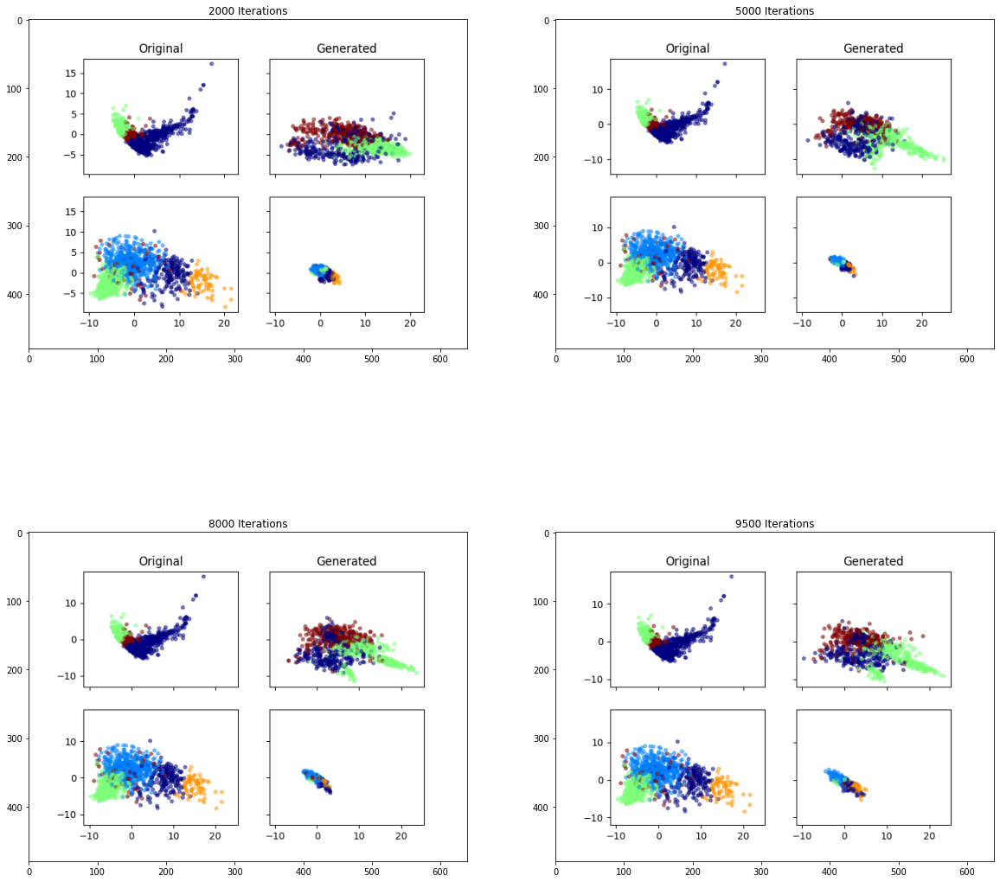

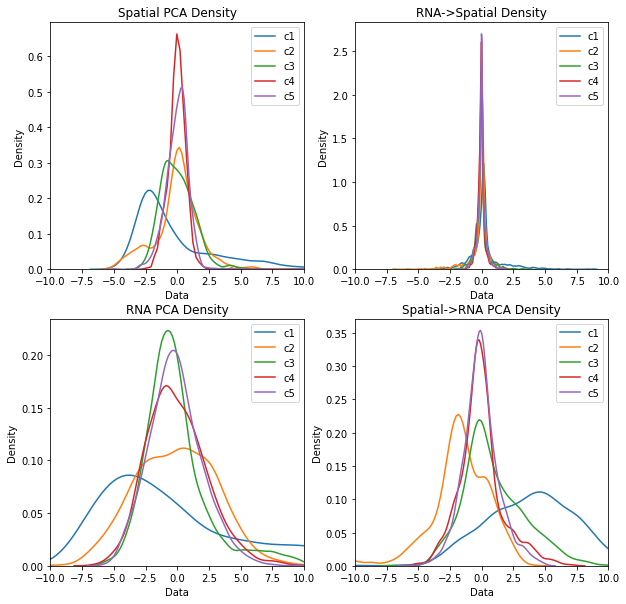

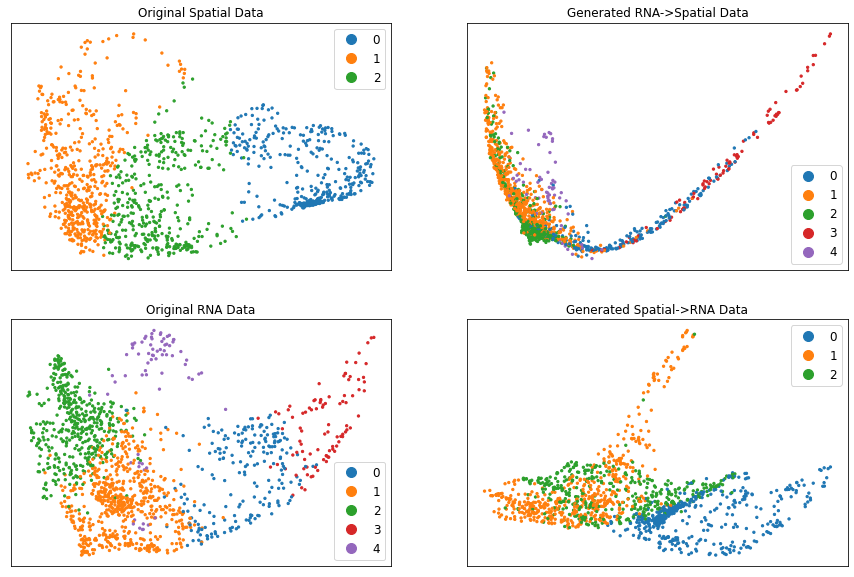

In [12]:
analyze_results(10, [2000, 5000, 8000, 9500])

In [ ]:
plot_spatial_coords(10)

In [ ]:
plot_spatial_coords(10, reconstruct=True)

In [ ]:
print_correlations(10, 20)

# Model 11

In [ ]:
analyze_results(11, [1000, 2000, 3500, 4500])

In [ ]:
plot_spatial_coords(11)

In [ ]:
plot_spatial_coords(11, reconstruct=True)

In [ ]:
print_correlations(11, 20)

# Model 12

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12/MAGAN_model_2499
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12


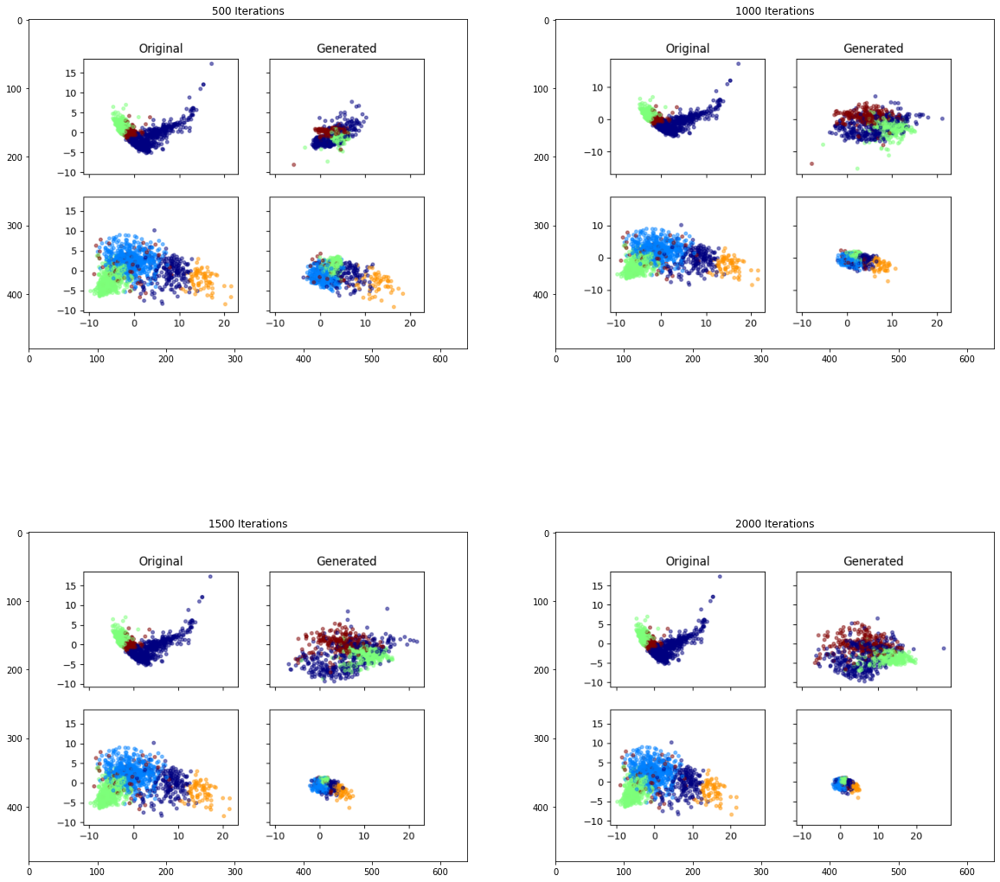

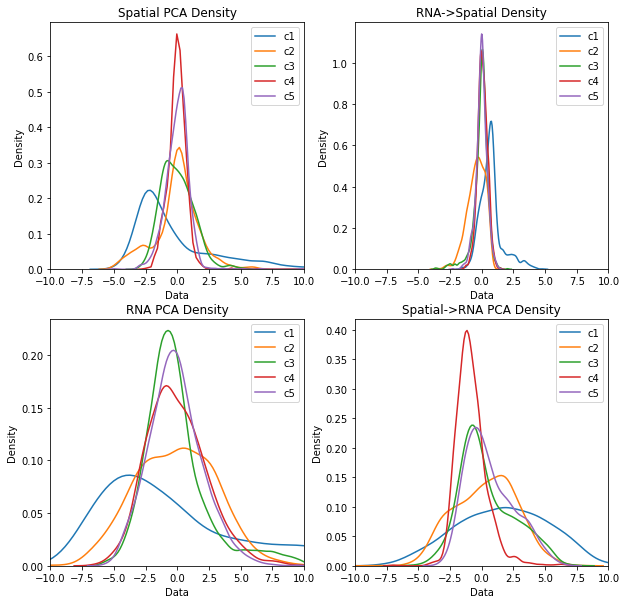

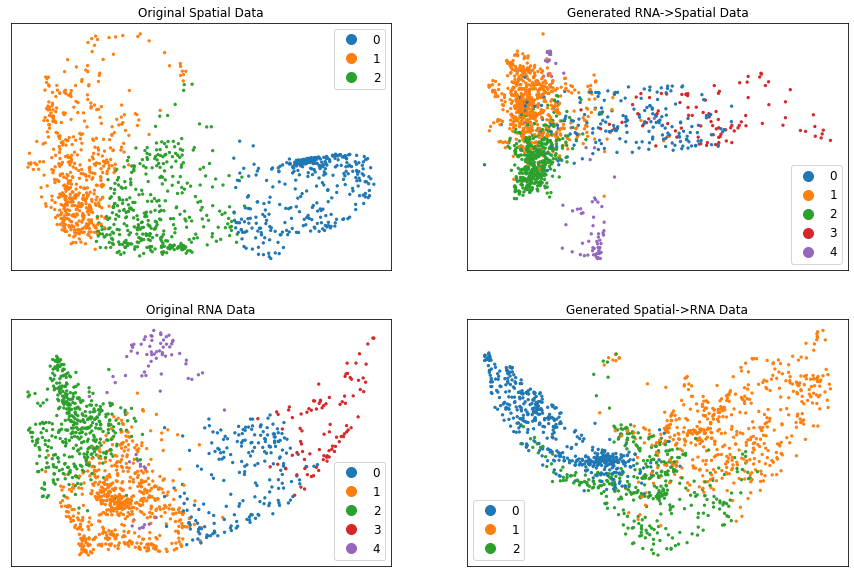

In [44]:
analyze_results(12, [500, 1000, 1500, 2000])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12/MAGAN_model_2499
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12


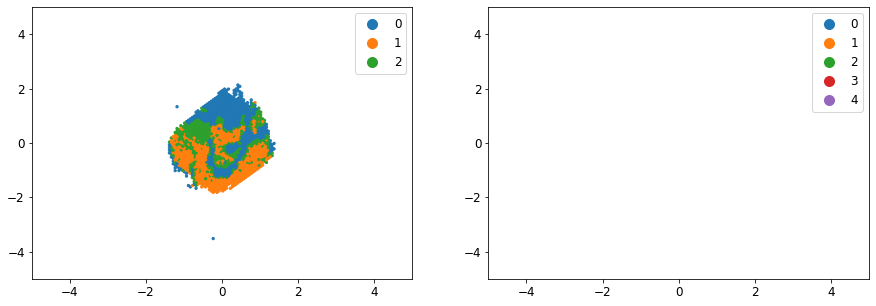

In [45]:
plot_spatial_coords(12)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12/MAGAN_model_2499
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12


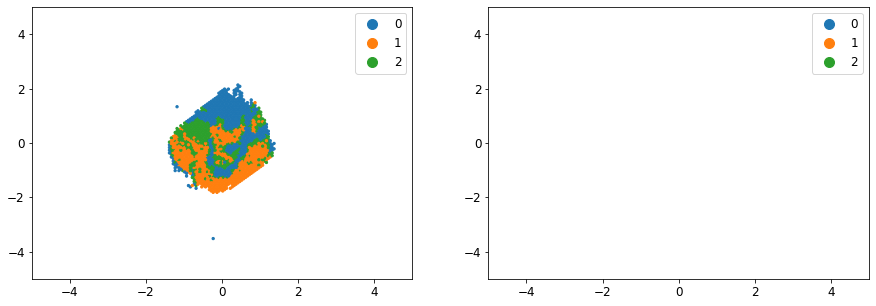

In [46]:
plot_spatial_coords(12, reconstruct=True)

In [47]:
print_correlations(12, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12/MAGAN_model_2499
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model12
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.5398158, 0.49431083, 0.5167485]
Correlations by cluster by gene
[0.36151665, 0.33226007, 0.26613182]
Correlations by cluster by cell
[0.8529027, 0.8380534, 0.83565974, 0.84845406, 0.82721746]
Correlations by cluster by gene
[0.19221112, 0.2661554, 0.25713846, 0.19908617, 0.28237158]


# Model 13

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model13/MAGAN_model_24999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model13


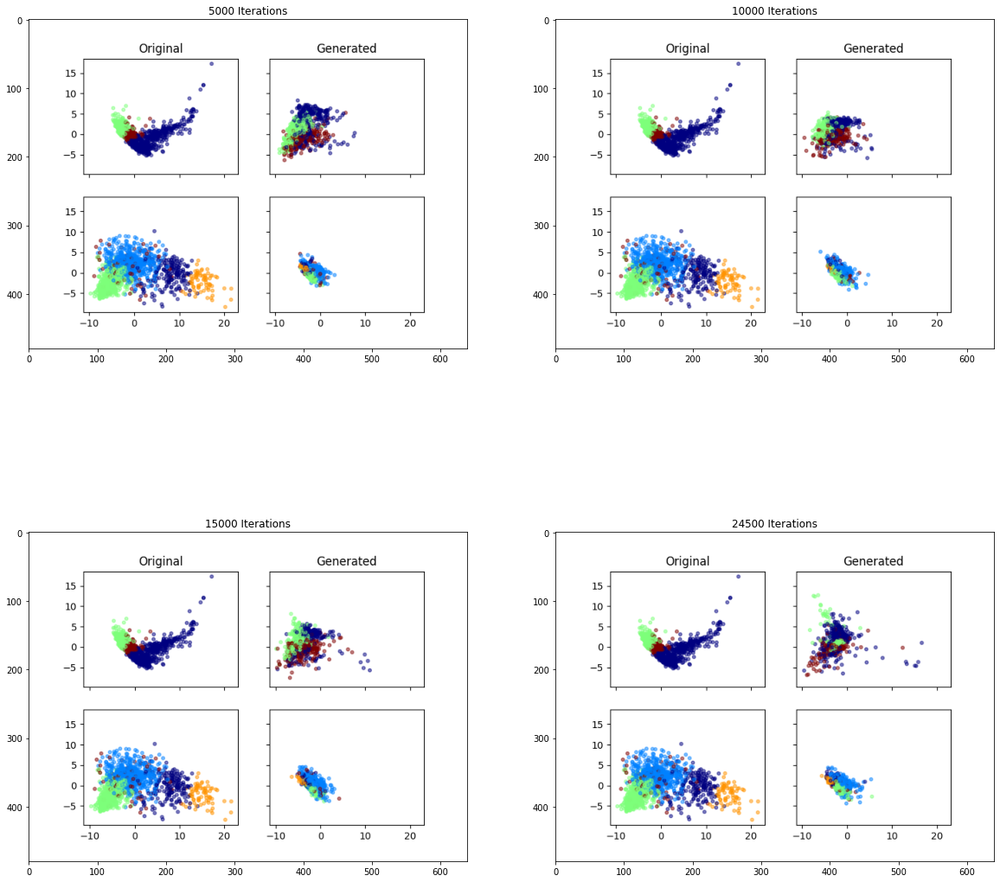

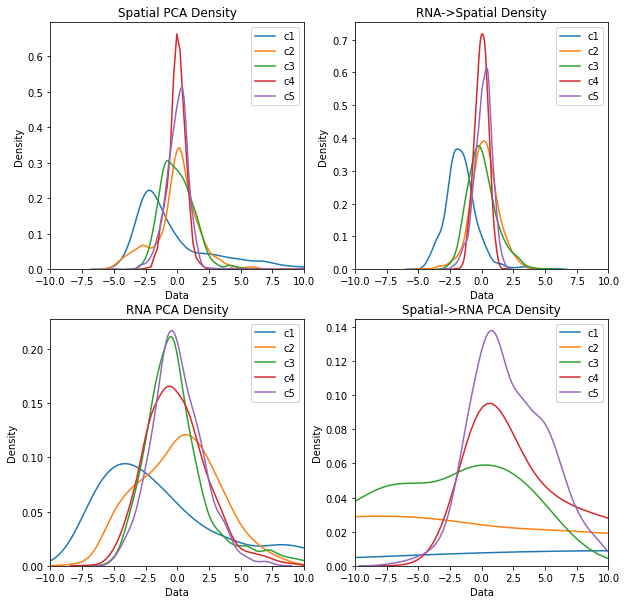

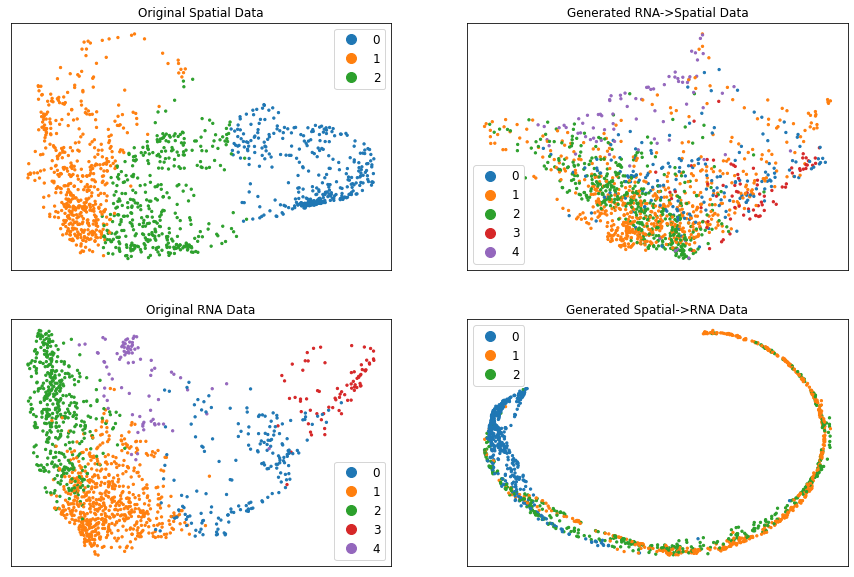

In [21]:
analyze_results(13, [5000, 10000, 15000, 24500])

In [ ]:
plot_spatial_coords(13)

In [ ]:
plot_spatial_coords(13, reconstruct=True)

In [ ]:
print_correlations(13, 20)

# Model 14

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model14/MAGAN_model_4999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model14


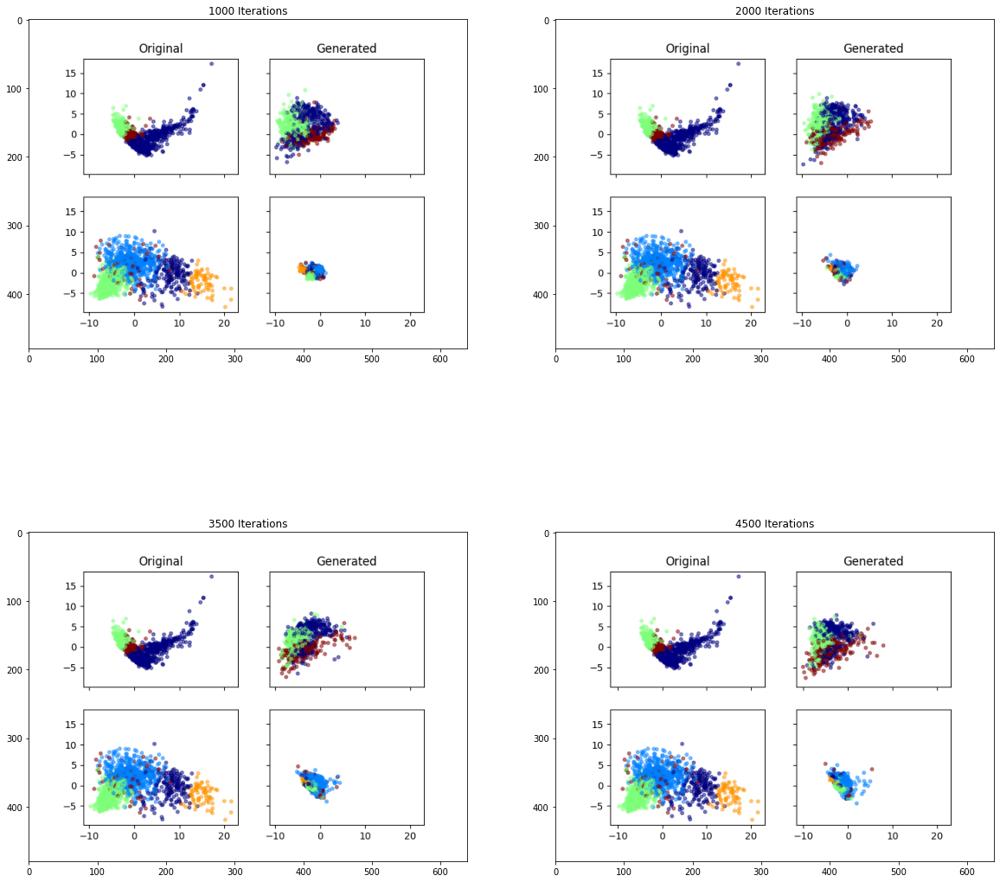

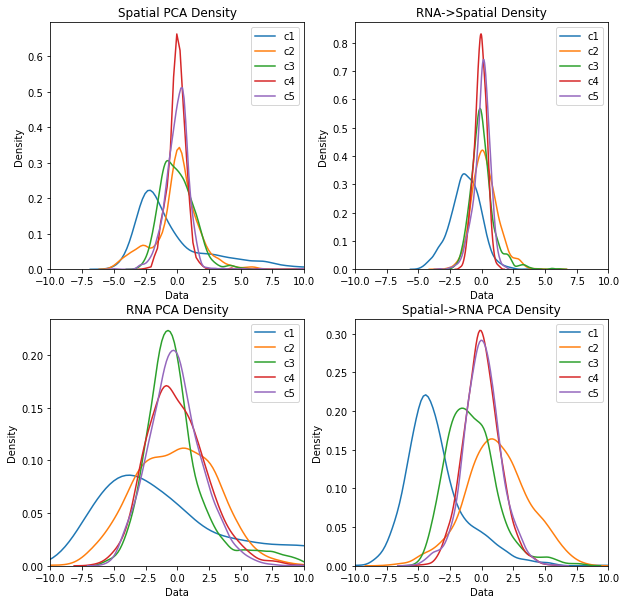

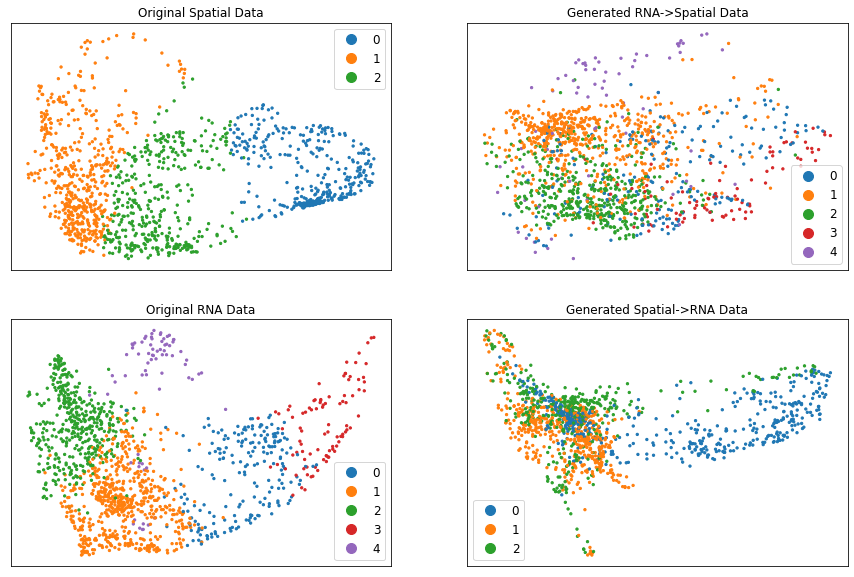

In [16]:
analyze_results(14, [1000, 2000, 3500, 4500])

In [18]:
print_correlations(14, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model14/MAGAN_model_4999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model14
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.6747837, 0.6389762, 0.6544841]
Correlations by cluster by gene
[0.1844274, 0.1858739, 0.10725492]
Correlations by cluster by cell
[0.7311652, 0.71606874, 0.72544914, 0.724953, 0.6912422]
Correlations by cluster by gene
[0.13626374, 0.19113864, 0.17032304, 0.13173603, 0.19639245]


INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model14/MAGAN_model_4999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model14


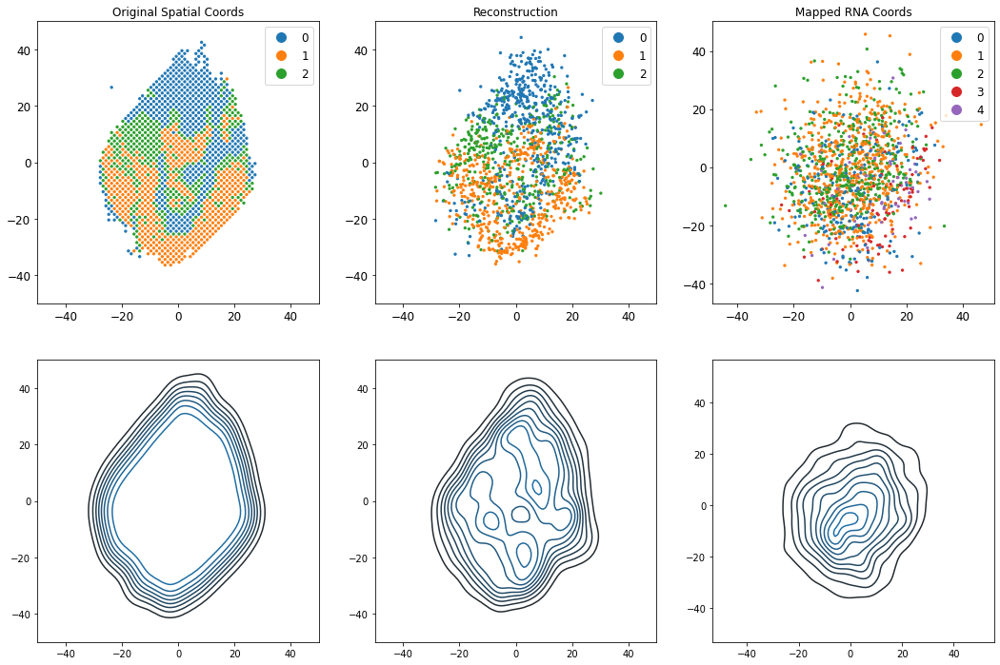

In [12]:
plot_spatial_coords(14, scale=100)

# Model 15

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model15/MAGAN_model_24999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model15


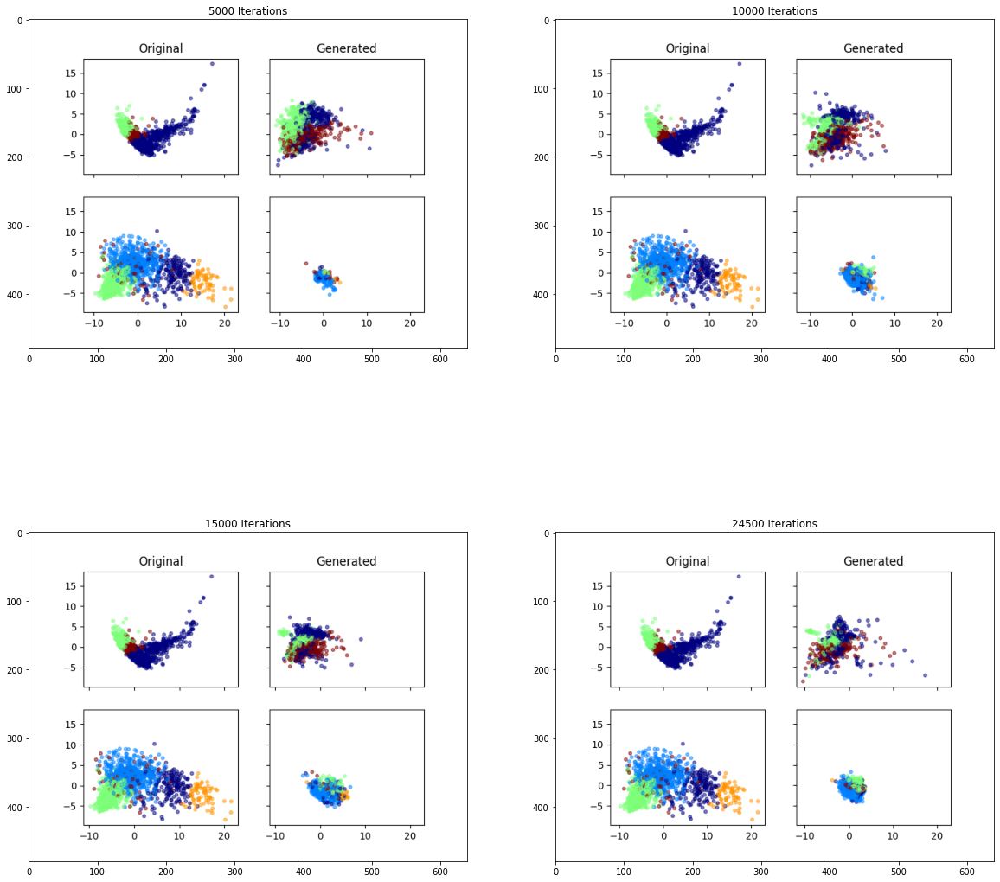

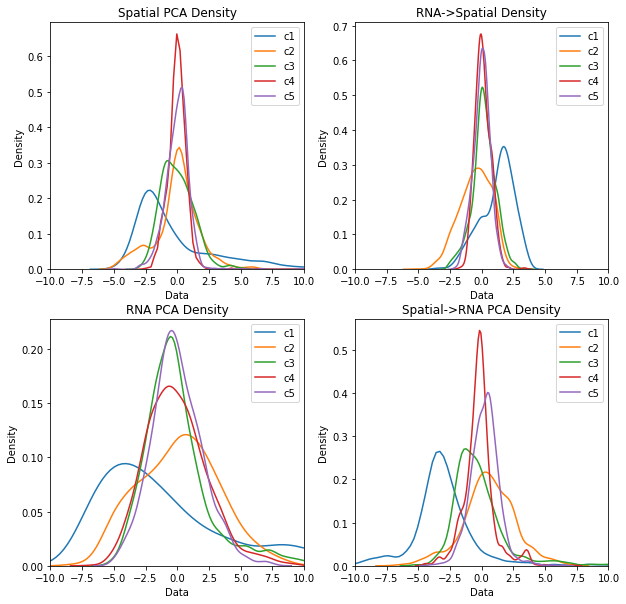

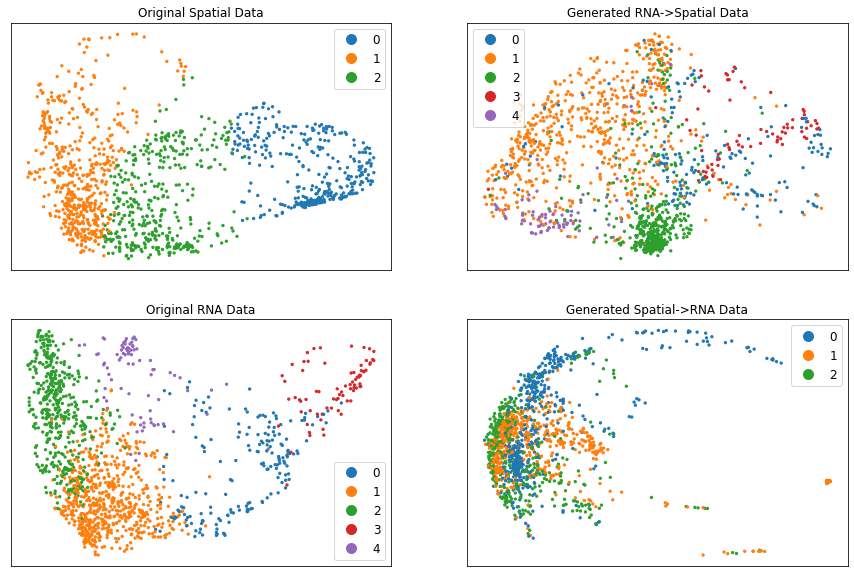

In [18]:
analyze_results(15, [5000, 10000, 15000, 24500])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model15/MAGAN_model_24999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model15


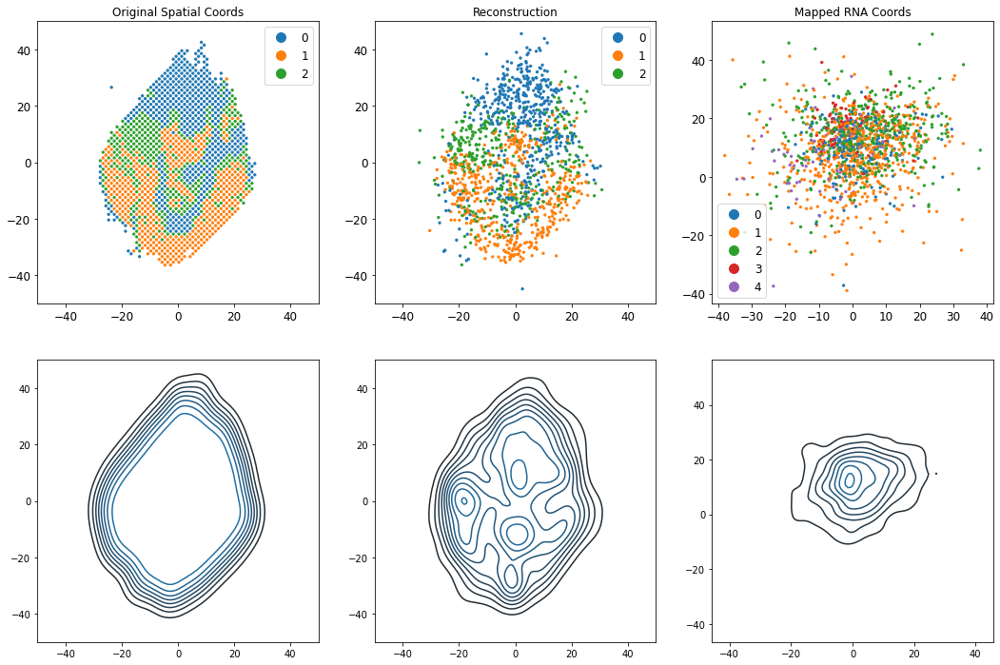

In [45]:
plot_spatial_coords(15, scale=100)

In [48]:
print_correlations(15, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model15/MAGAN_model_24999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model15
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.67668015, 0.63688755, 0.6545422]
Correlations by cluster by gene
[0.111513056, 0.0986219, 0.156513]
Correlations by cluster by cell
[0.70728403, 0.67741764, 0.69406015, 0.69874114, 0.66521376]
Correlations by cluster by gene
[0.15111619, 0.18709081, 0.20627436, 0.14297551, 0.24190316]


# Model 16

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model16/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model16


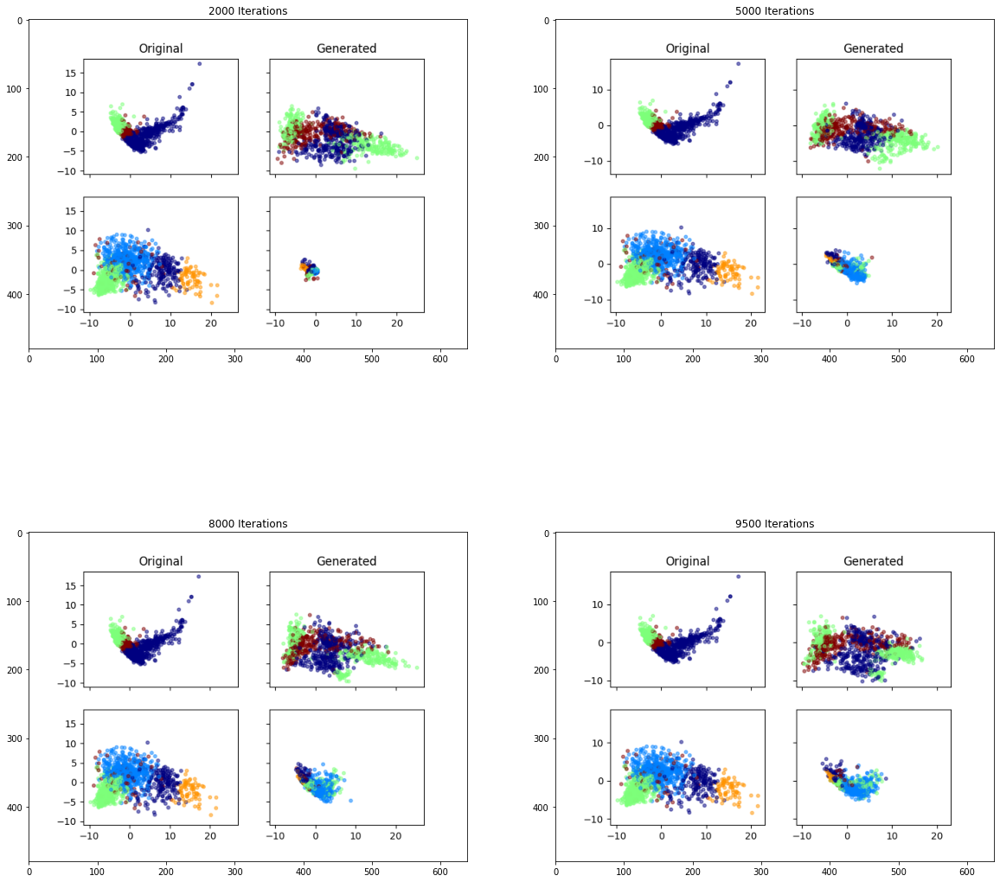

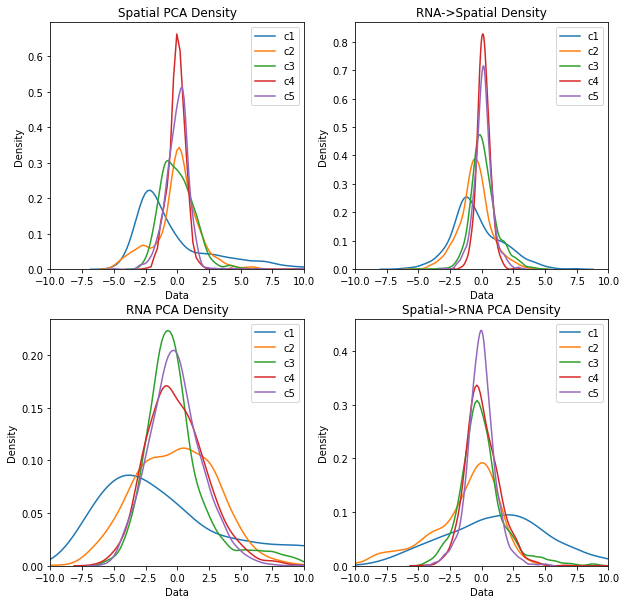

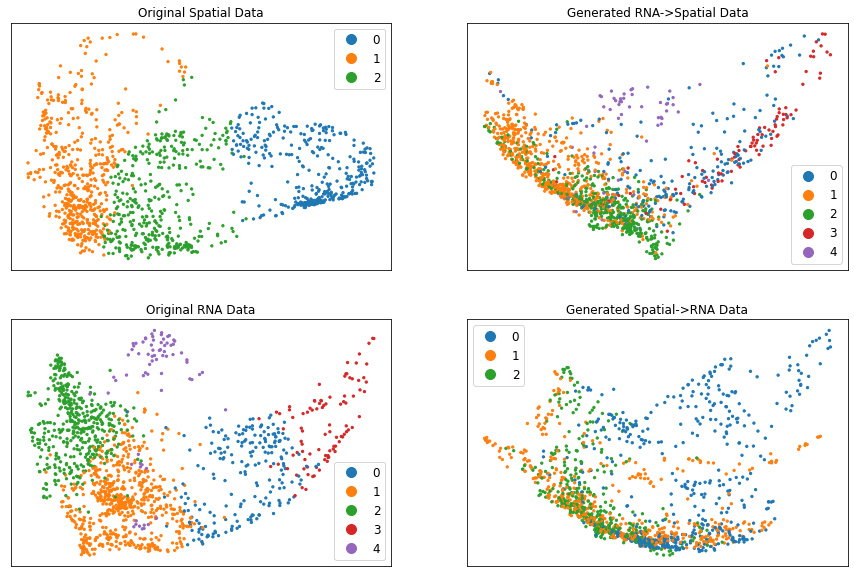

In [65]:
analyze_results(16, [2000, 5000, 8000, 9500])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model16/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model16


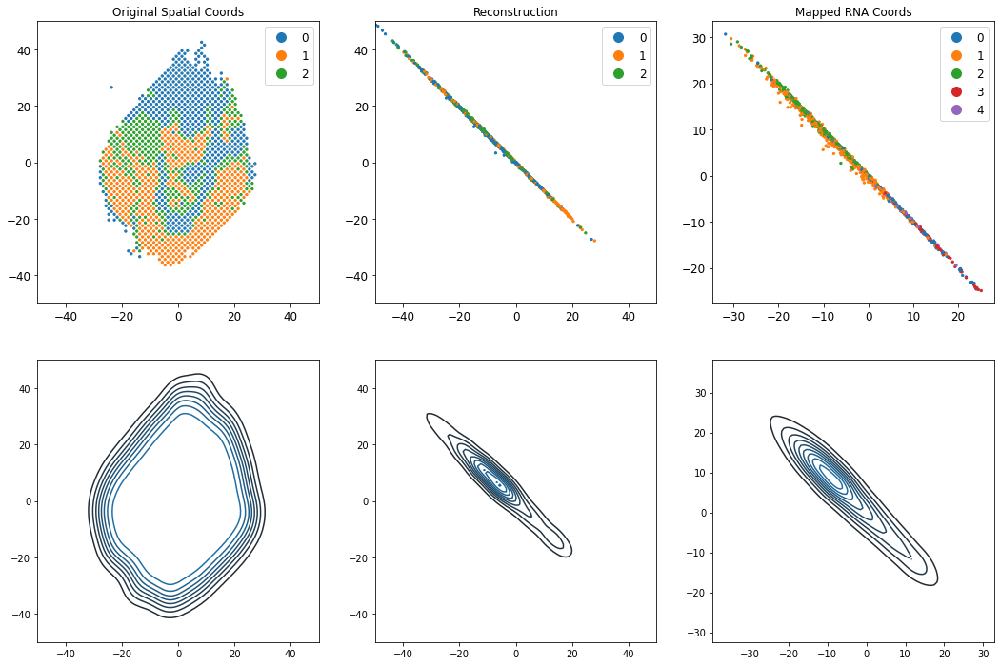

In [46]:
plot_spatial_coords(16, scale=100)

# Model 17

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model17/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model17


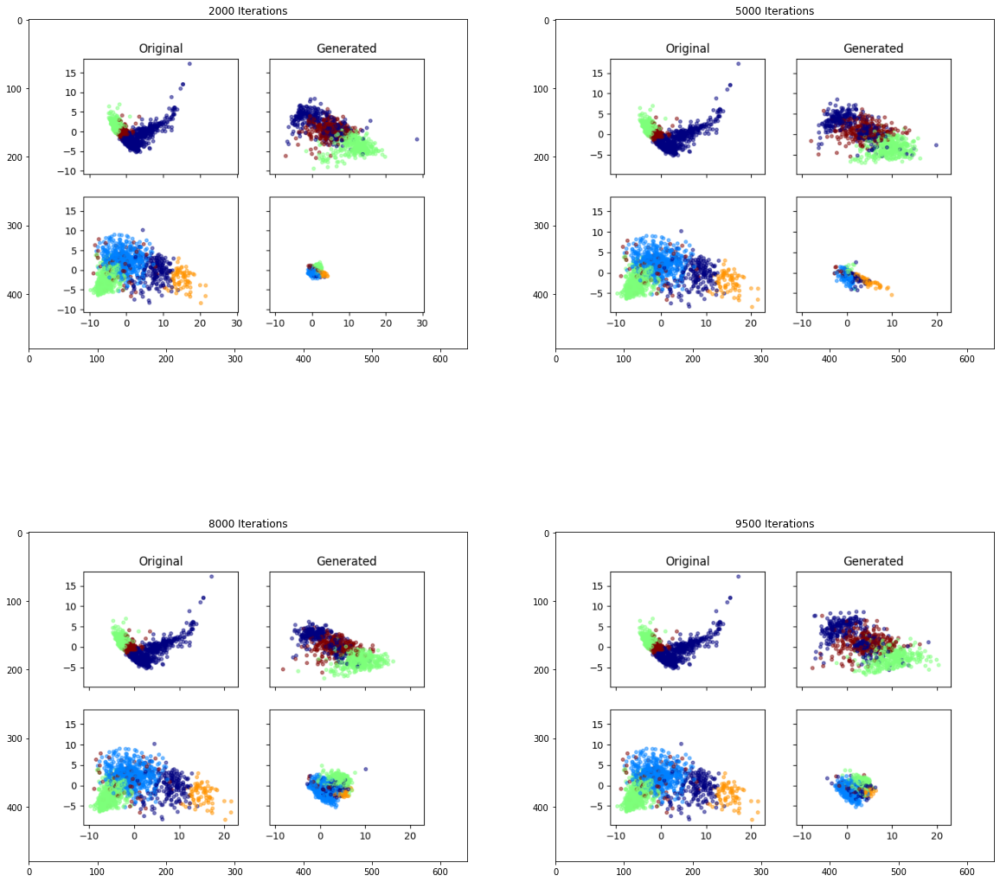

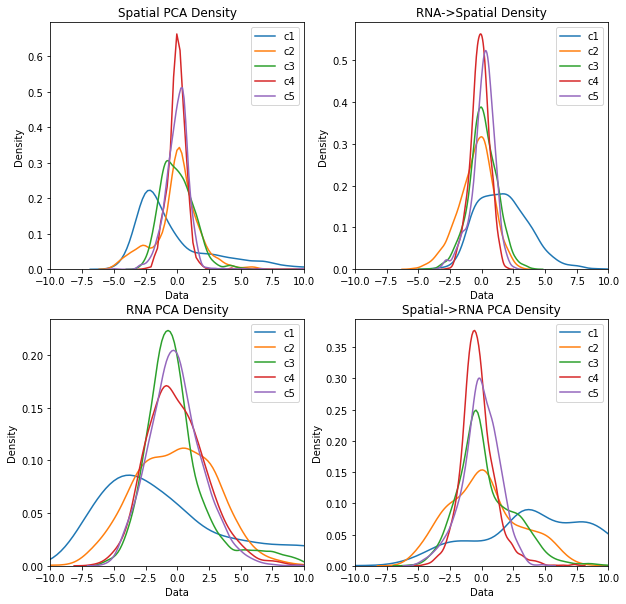

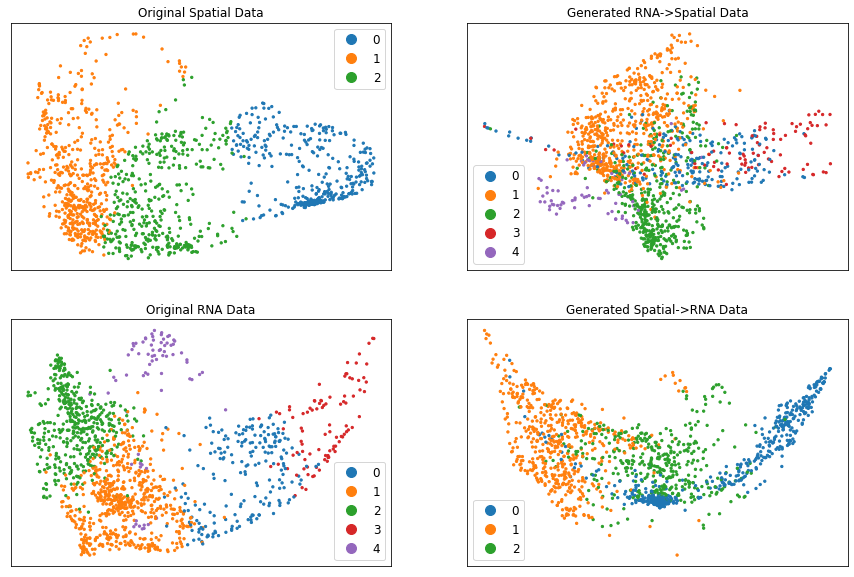

In [77]:
analyze_results(17, [2000, 5000, 8000, 9500])

In [78]:
print_correlations(17, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model17/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model17
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.7251663, 0.68671966, 0.6952685]
Correlations by cluster by gene
[0.4908287, 0.4842723, 0.3426058]
Correlations by cluster by cell
[0.69129014, 0.66420484, 0.6853872, 0.6882662, 0.66097254]
Correlations by cluster by gene
[0.09615814, 0.148616, 0.14189856, 0.088458434, 0.15675199]


INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model17/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model17


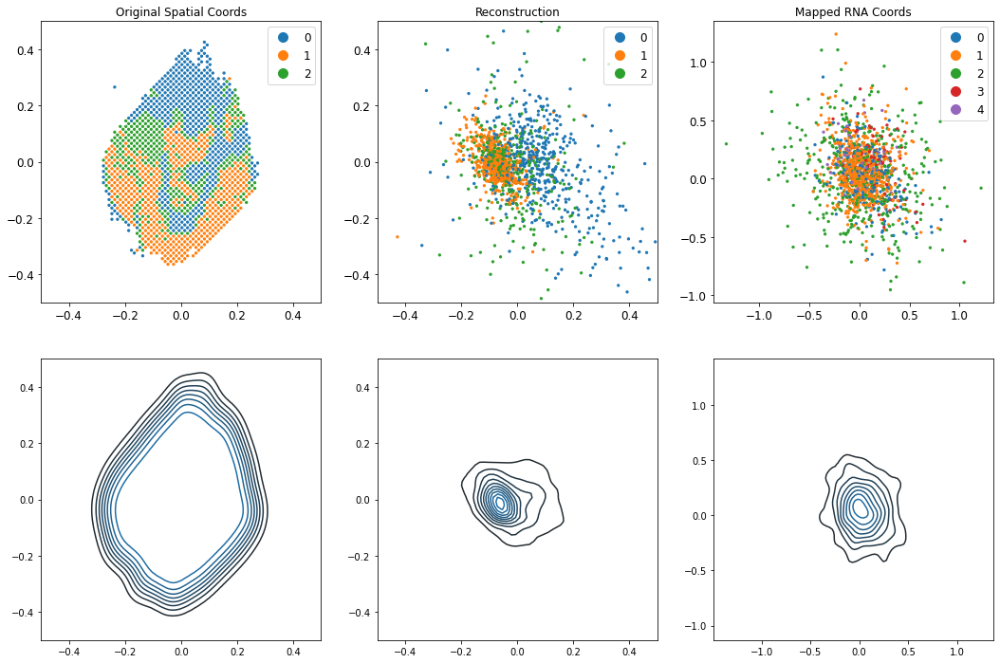

In [47]:
plot_spatial_coords(17, scale=1)

# Model 18

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model18/MAGAN_model_19999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model18


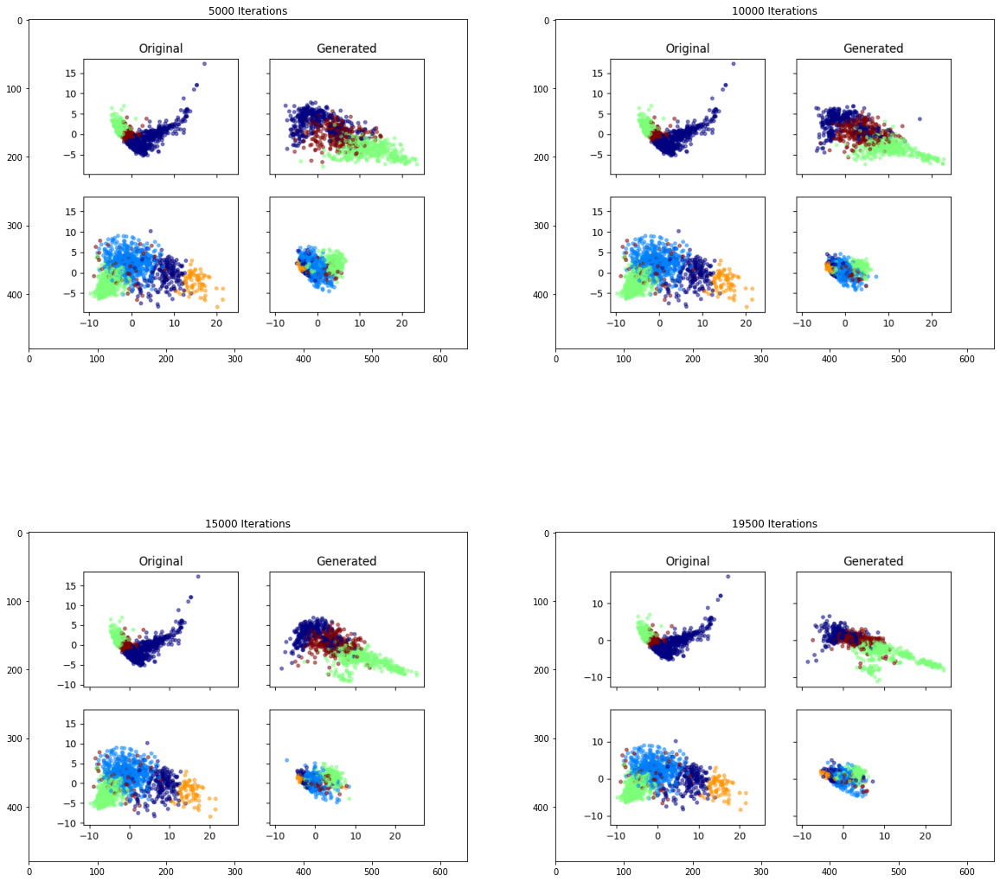

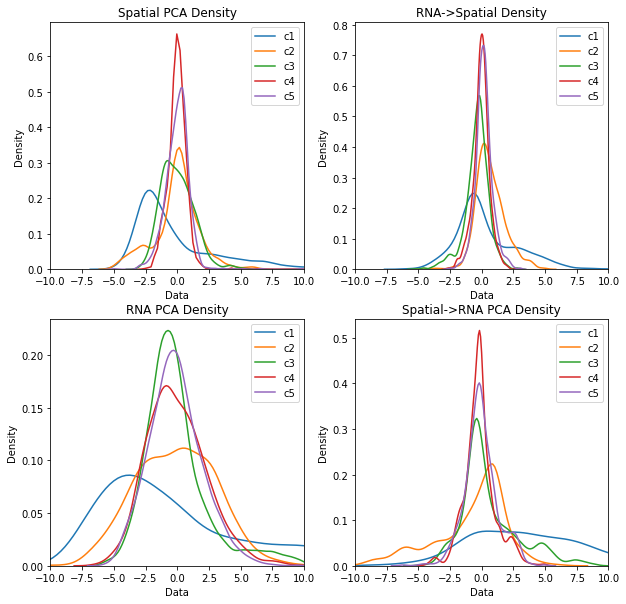

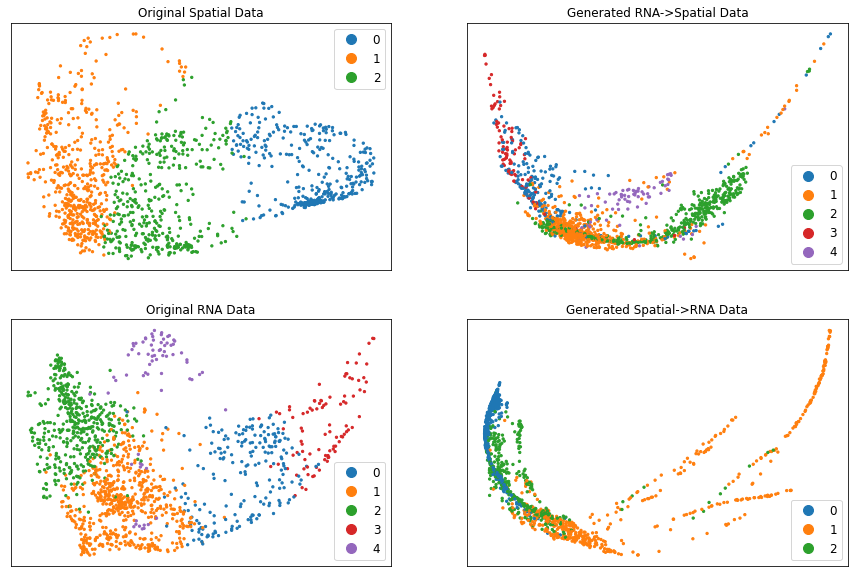

In [81]:
analyze_results(18, [5000, 10000, 15000, 19500])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model18/MAGAN_model_19999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model18


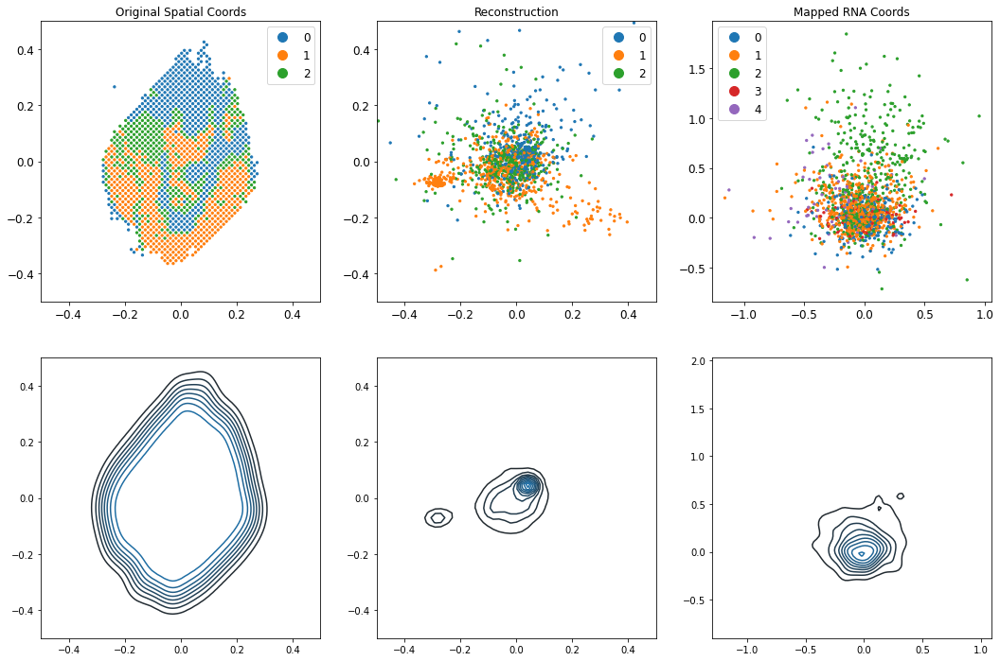

In [48]:
plot_spatial_coords(18, scale=1)

In [84]:
print_correlations(18, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model18/MAGAN_model_19999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model18
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.7096913, 0.6780576, 0.6835453]
Correlations by cluster by gene
[0.46509045, 0.4467845, 0.35073042]
Correlations by cluster by cell
[0.7171033, 0.6962526, 0.69334865, 0.7103132, 0.67014205]
Correlations by cluster by gene
[0.44472247, 0.38090557, 0.4594984, 0.45631775, 0.37327898]


# Model 19

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model19/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model19


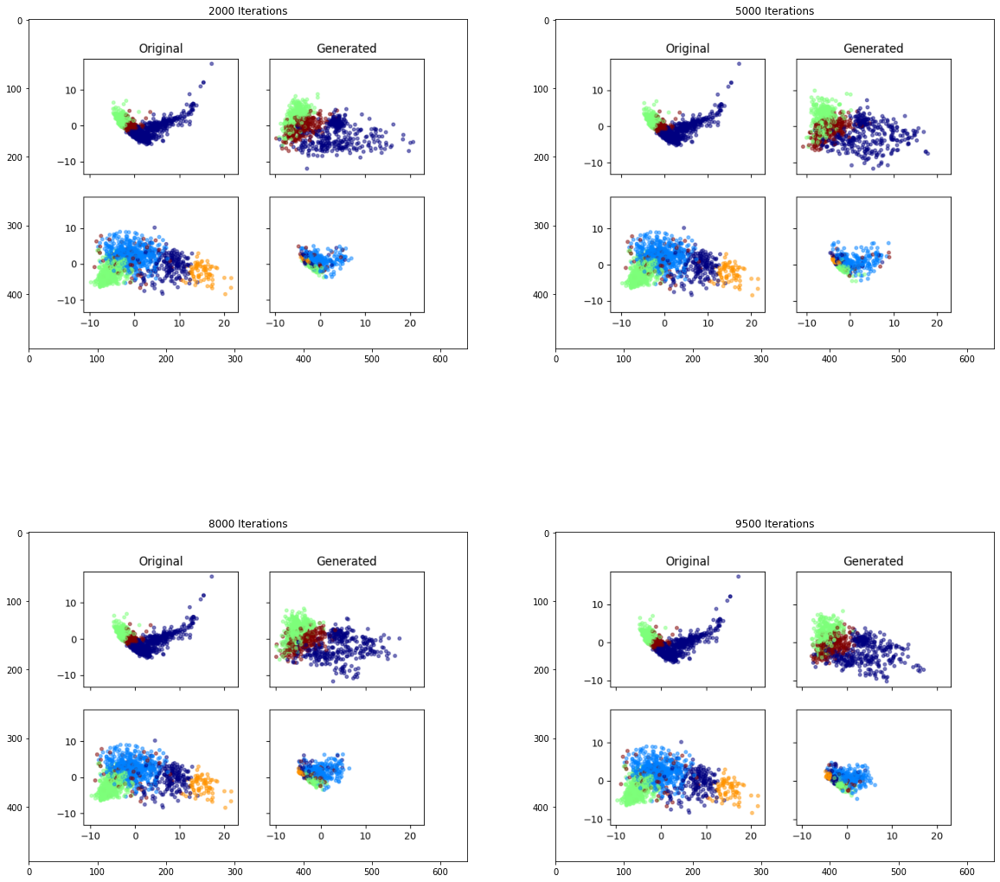

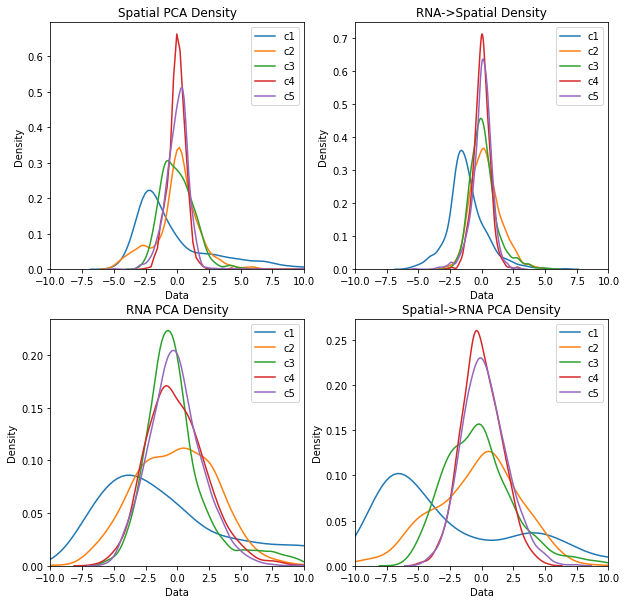

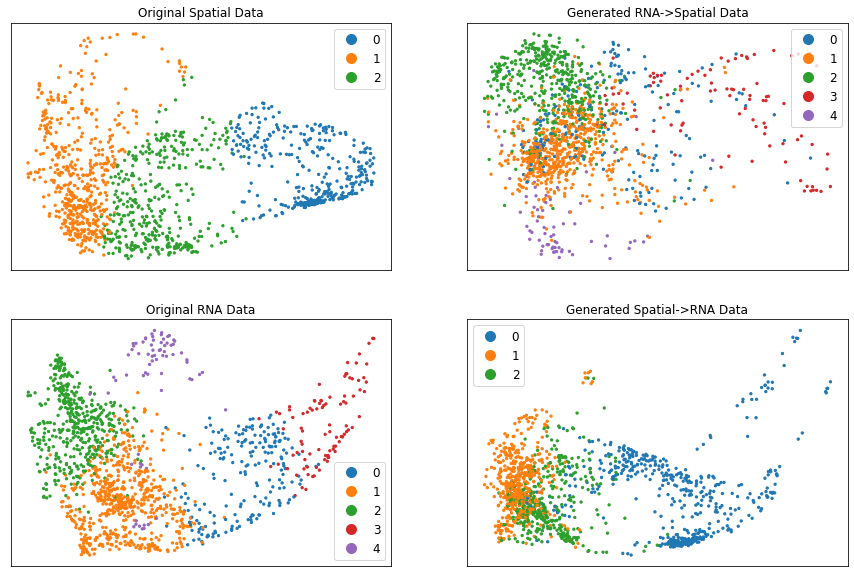

In [85]:
analyze_results(19, [2000, 5000, 8000, 9500])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model19/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model19


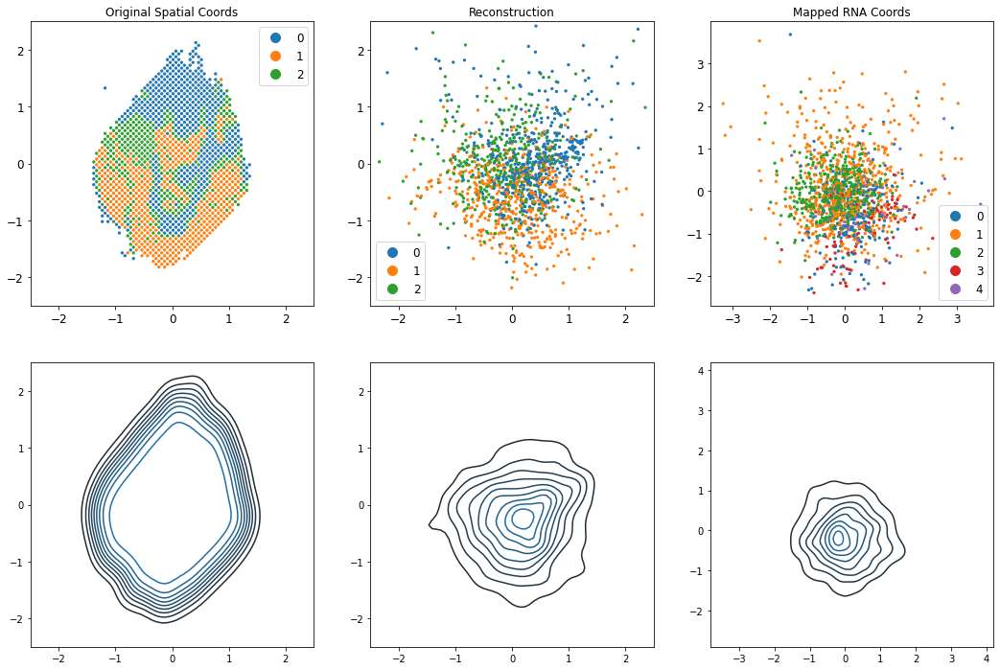

In [49]:
plot_spatial_coords(19, scale=5)

In [89]:
print_correlations(19, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model19/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model19
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.7126737, 0.67265147, 0.6852368]
Correlations by cluster by gene
[0.6347583, 0.61908793, 0.5266125]
Correlations by cluster by cell
[0.73473316, 0.71346664, 0.716514, 0.7274885, 0.69112295]
Correlations by cluster by gene
[0.16431588, 0.20916602, 0.19391803, 0.15552963, 0.25560594]


# Model 20

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20


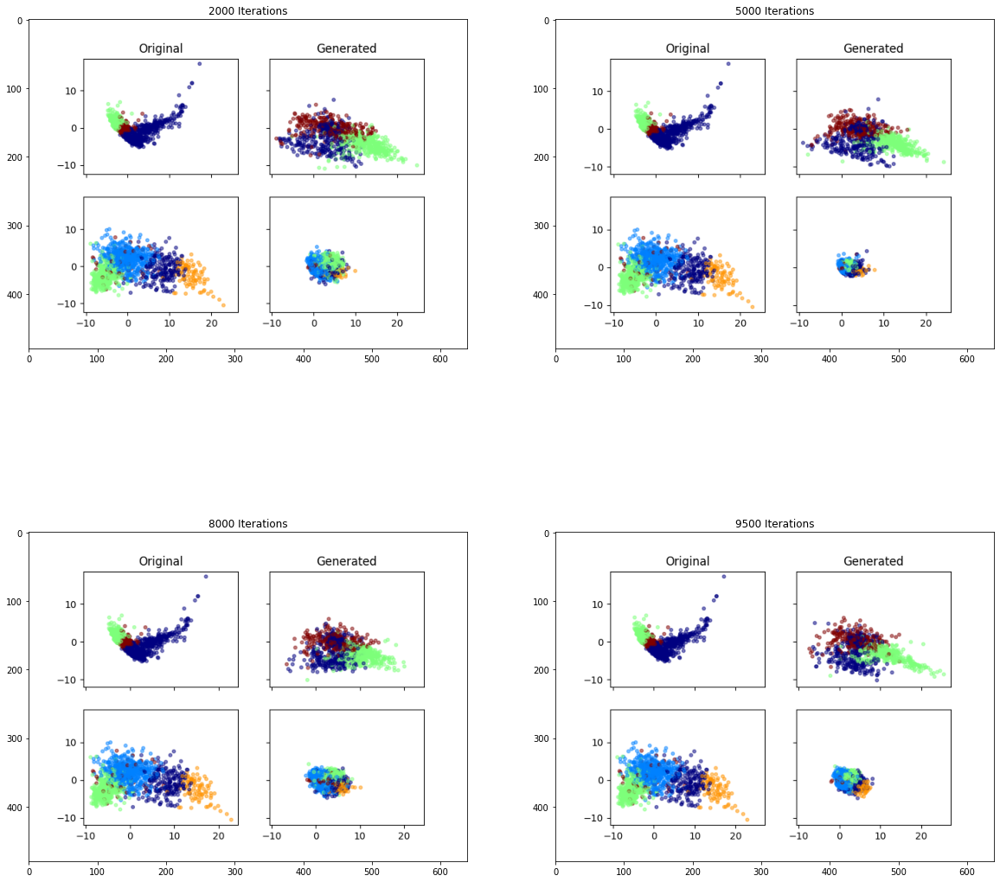

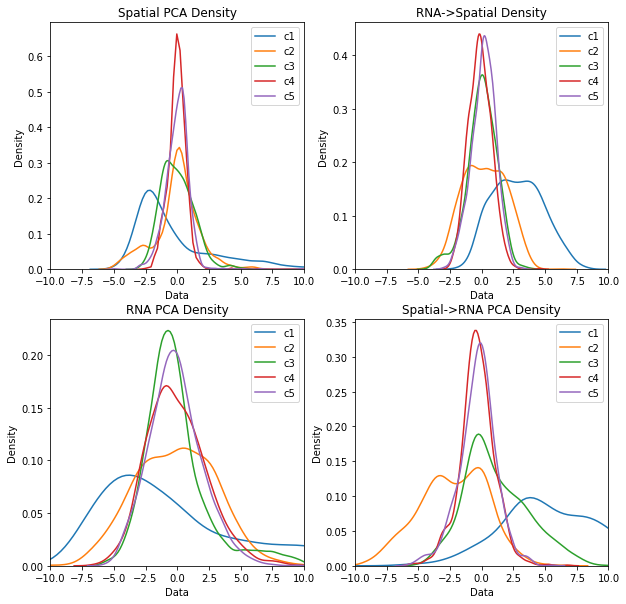

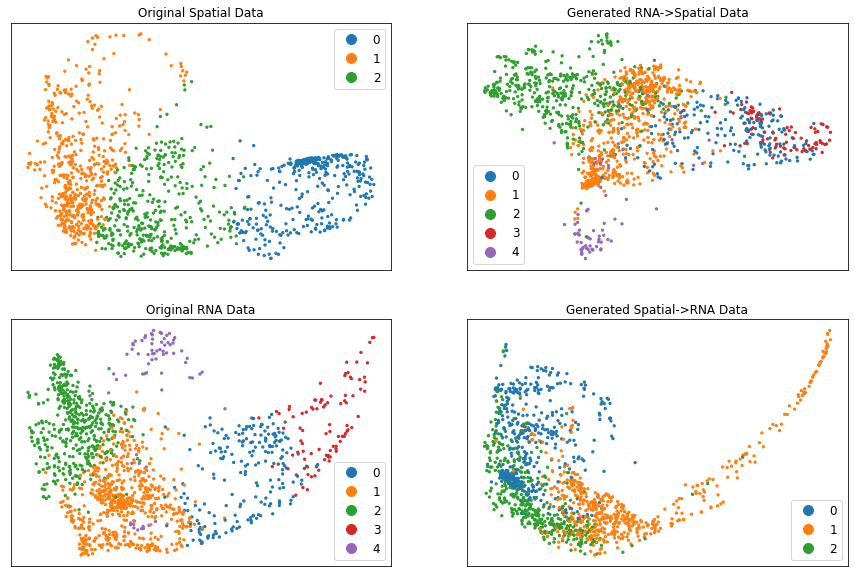

In [54]:
analyze_results(20, [2000, 5000, 8000, 9500])

In [96]:
print_correlations(20, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.721338, 0.6825938, 0.7058195]
Correlations by cluster by gene
[0.11482404, 0.1031178, 0.15757239]
Correlations by cluster by cell
[0.88199914, 0.8677913, 0.8674814, 0.8759835, 0.85294366]
Correlations by cluster by gene
[0.20273142, 0.19143915, 0.23038872, 0.21855228, 0.14904013]


INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20


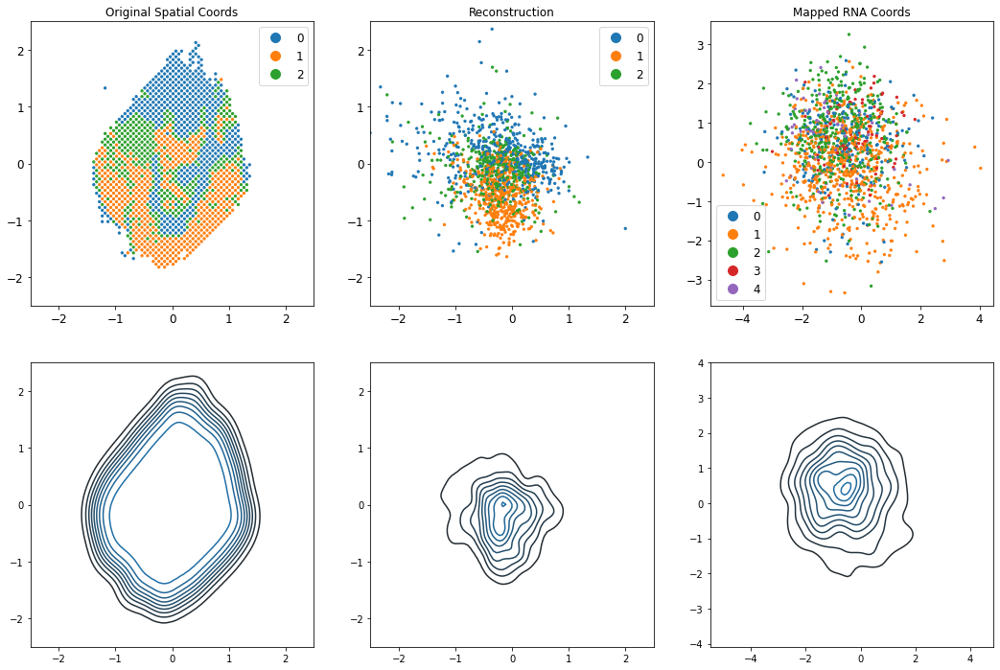

In [20]:
plot_spatial_coords(20, scale=5)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model20
INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model24/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model24
INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model25/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model25


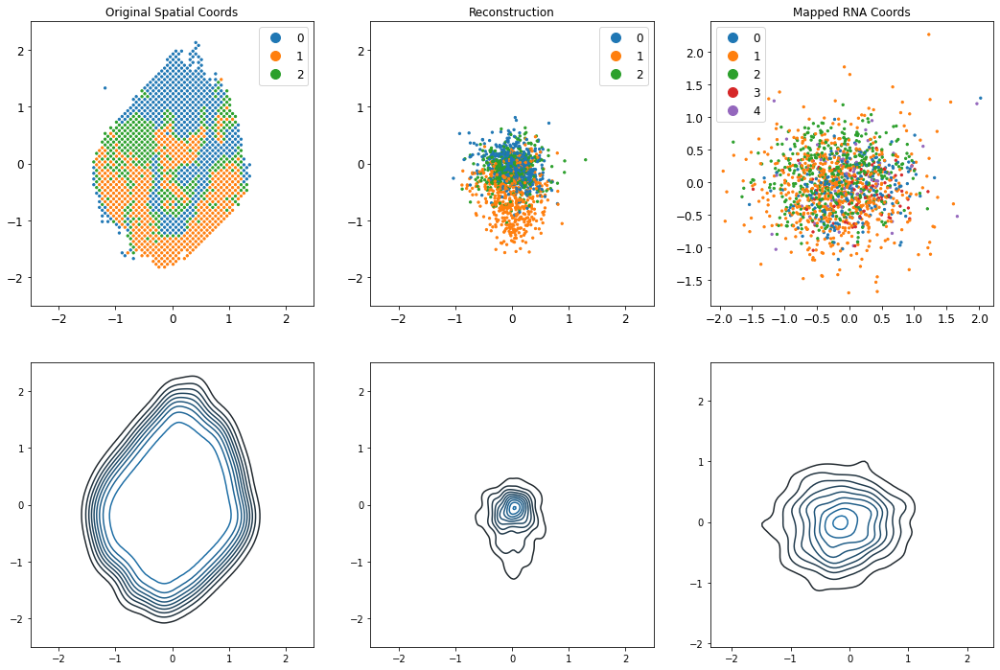

In [46]:
plot_spatial_coords(20, scale=5, other_models=[24,25])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model24/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model24


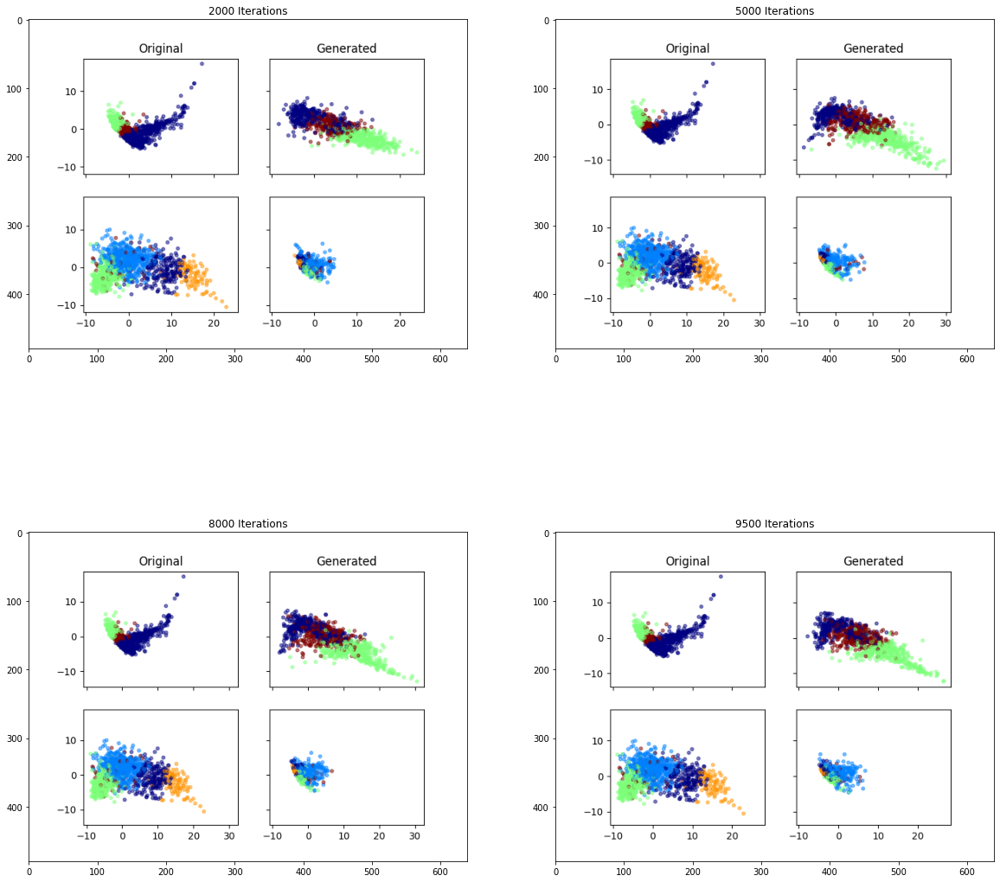

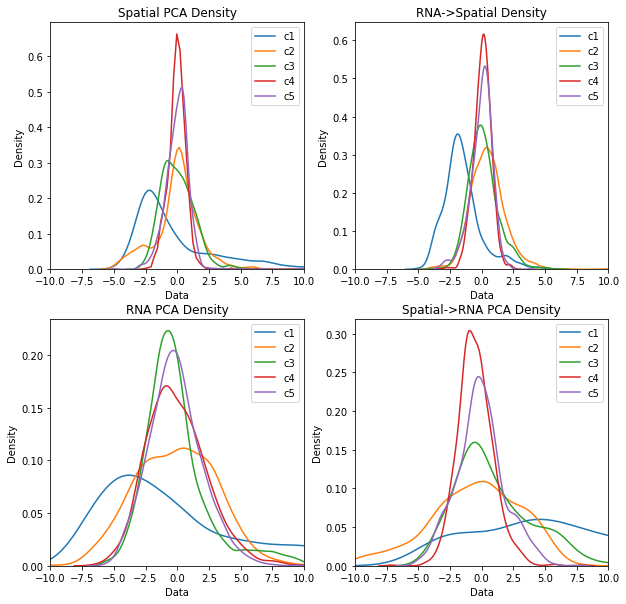

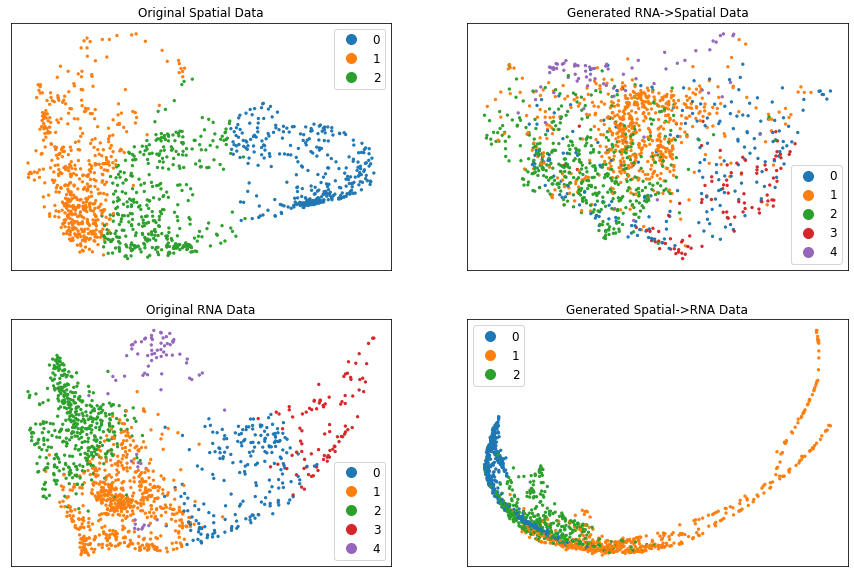

In [48]:
analyze_results(24, [2000, 5000, 8000, 9500])

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model25/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model25


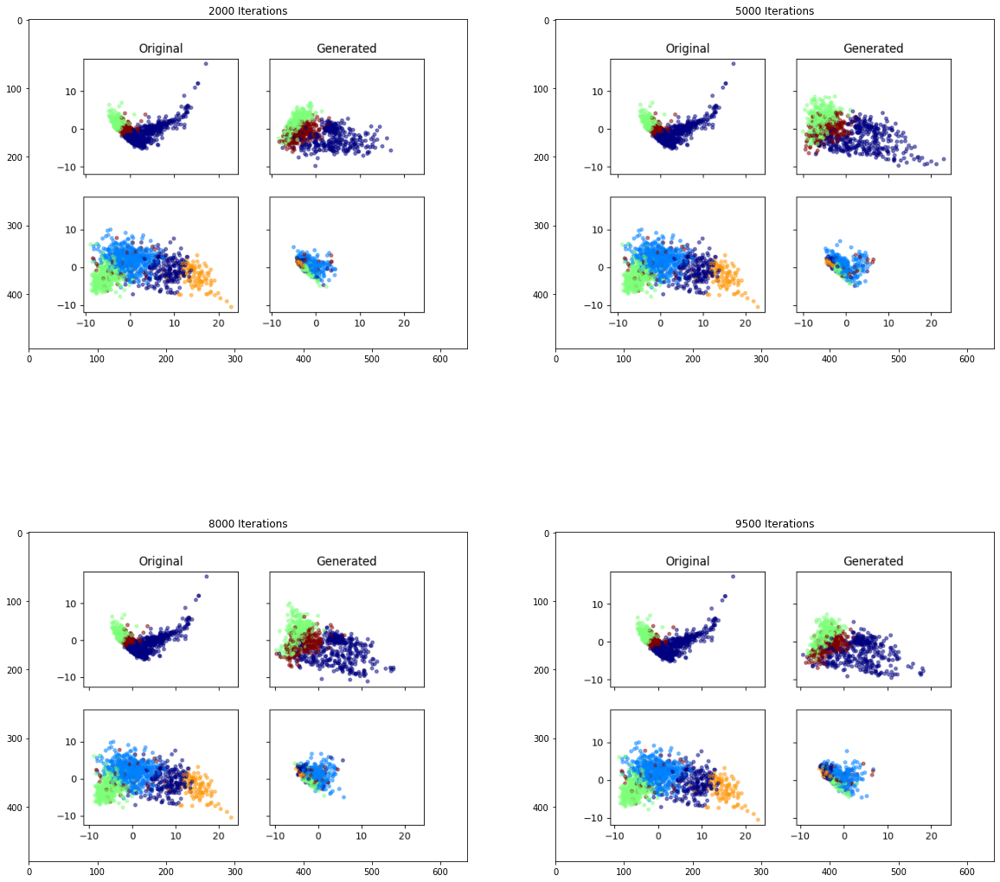

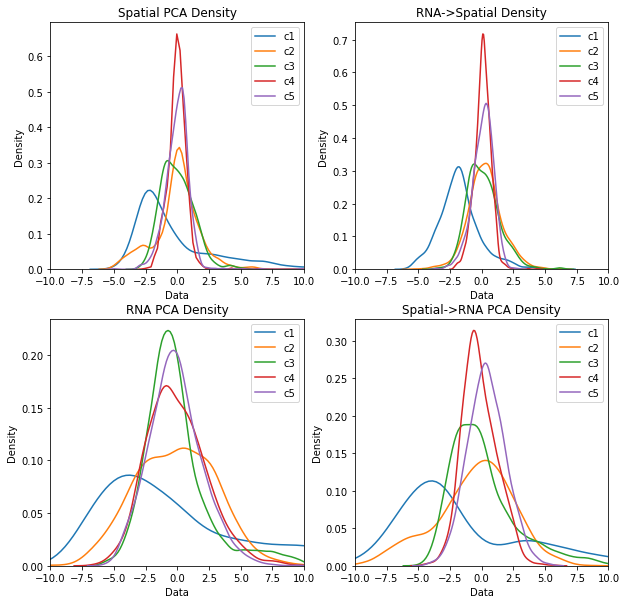

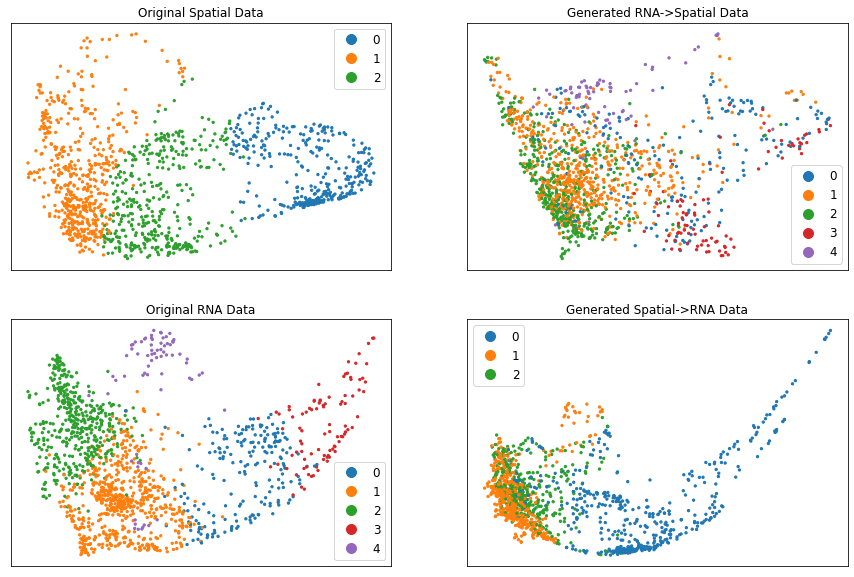

In [49]:
analyze_results(25, [2000, 5000, 8000, 9500])

# Model 21

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model21/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model21


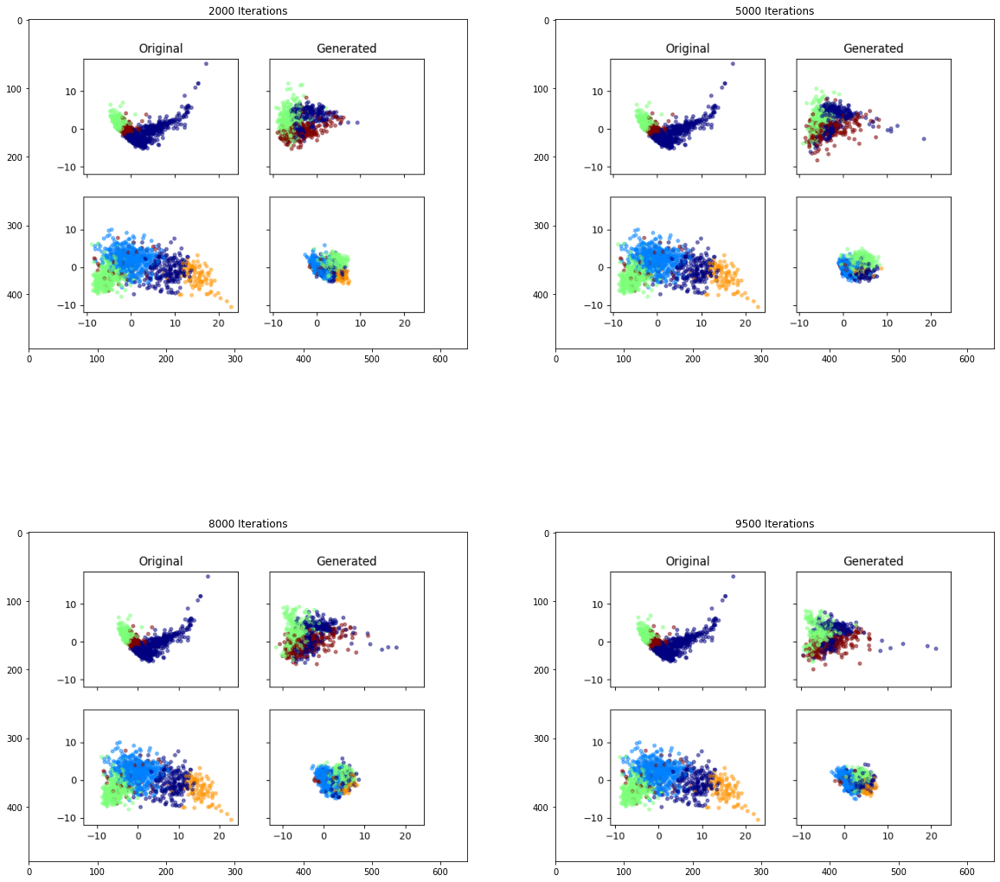

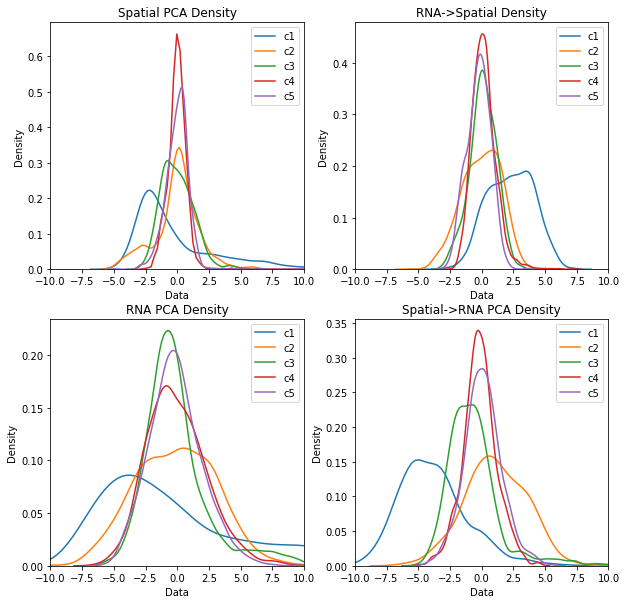

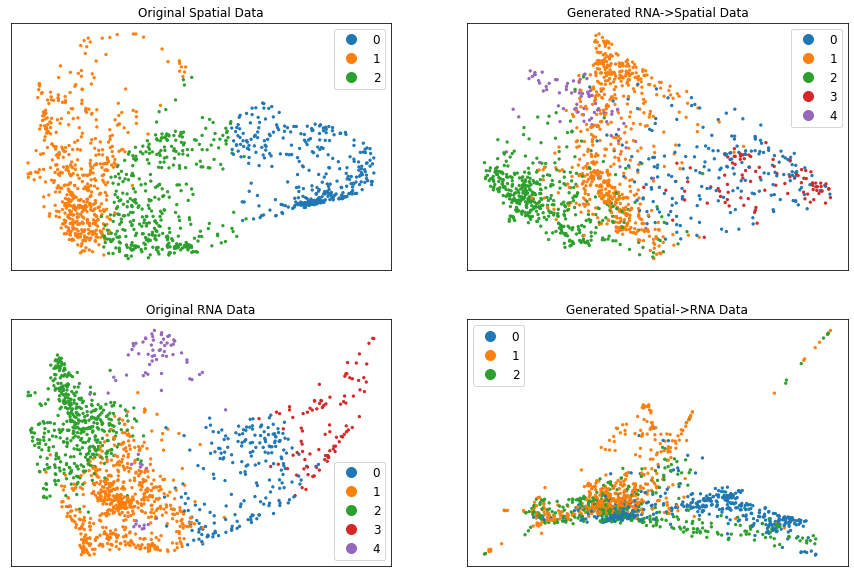

In [101]:
analyze_results(21, [2000, 5000, 8000, 9500])

In [102]:
print_correlations(21, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model21/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model21
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.6832126, 0.63954484, 0.6638453]
Correlations by cluster by gene
[0.09716483, 0.08334058, 0.15003254]
Correlations by cluster by cell
[0.83588874, 0.82031727, 0.82613605, 0.8314782, 0.8040526]
Correlations by cluster by gene
[0.19477345, 0.1739923, 0.22865689, 0.20041084, 0.17381135]


INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model21/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model21


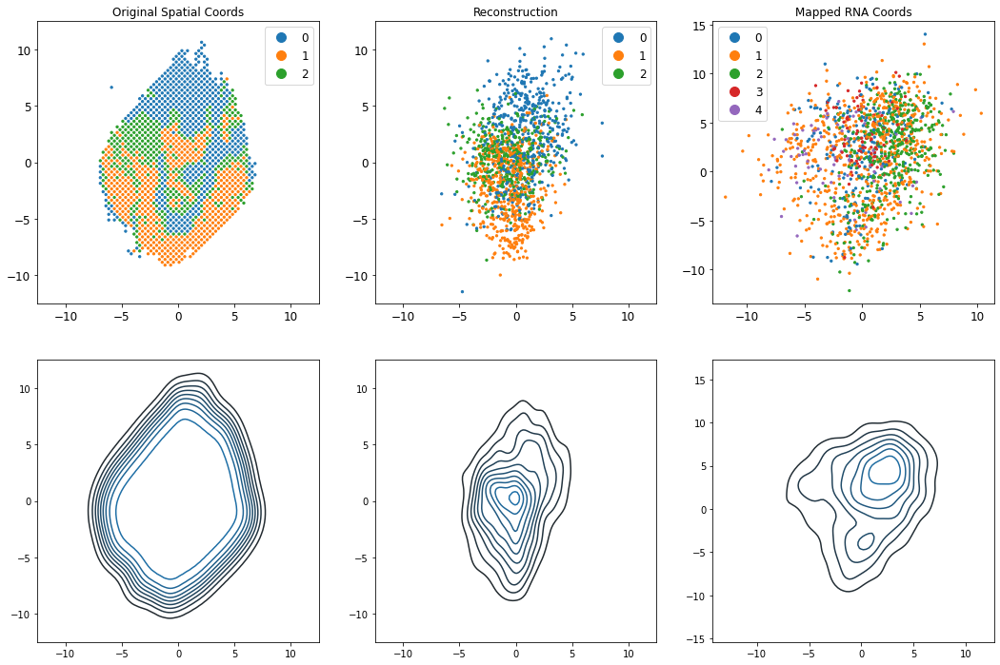

In [51]:
plot_spatial_coords(21, scale=25)

# Model 22

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model22/MAGAN_model_14999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model22


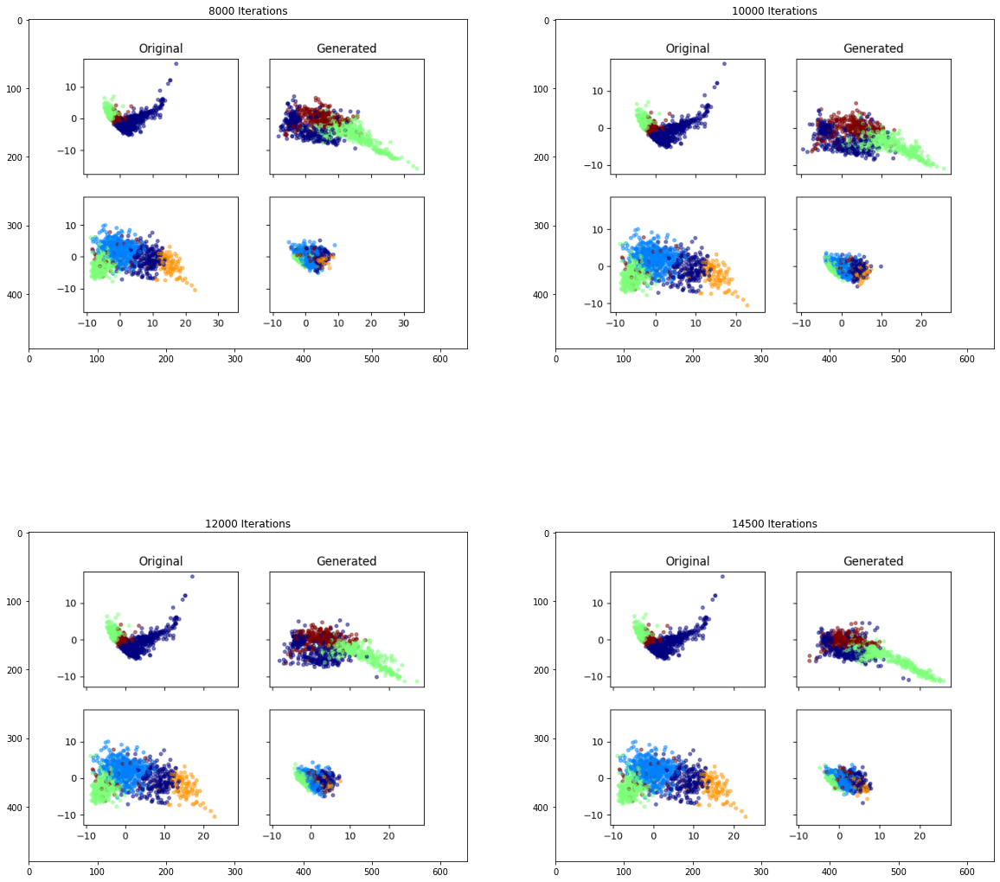

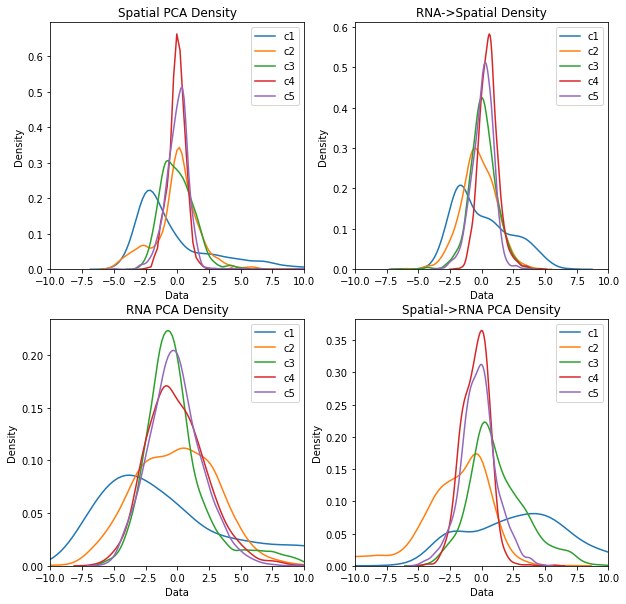

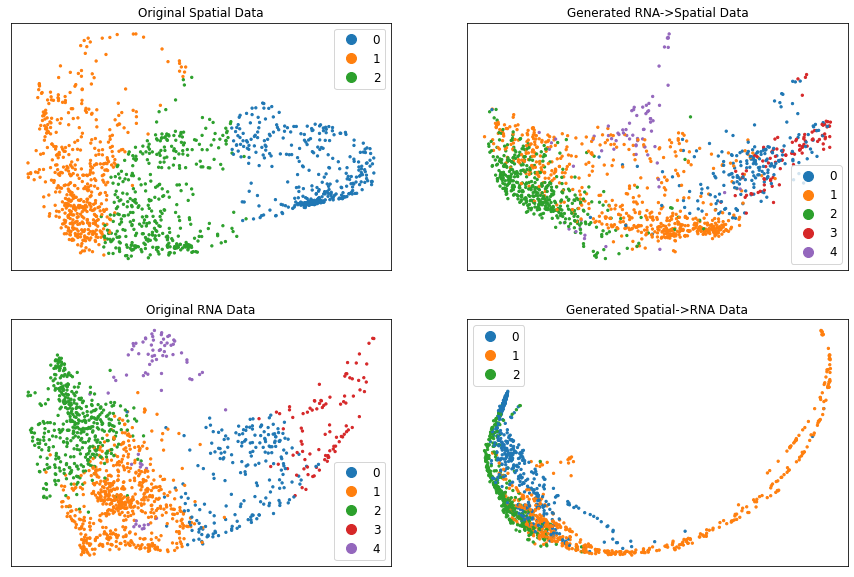

In [107]:
analyze_results(22, [8000, 10000, 12000, 14500])

In [108]:
print_correlations(22, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model22/MAGAN_model_14999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model22
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.71385354, 0.67623544, 0.6863345]
Correlations by cluster by gene
[0.13924648, 0.12413496, 0.21991602]
Correlations by cluster by cell
[0.8360605, 0.8227743, 0.8250798, 0.83011097, 0.80124074]
Correlations by cluster by gene
[0.50747, 0.44443783, 0.514084, 0.5145911, 0.3958126]


INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model22/MAGAN_model_14999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model22


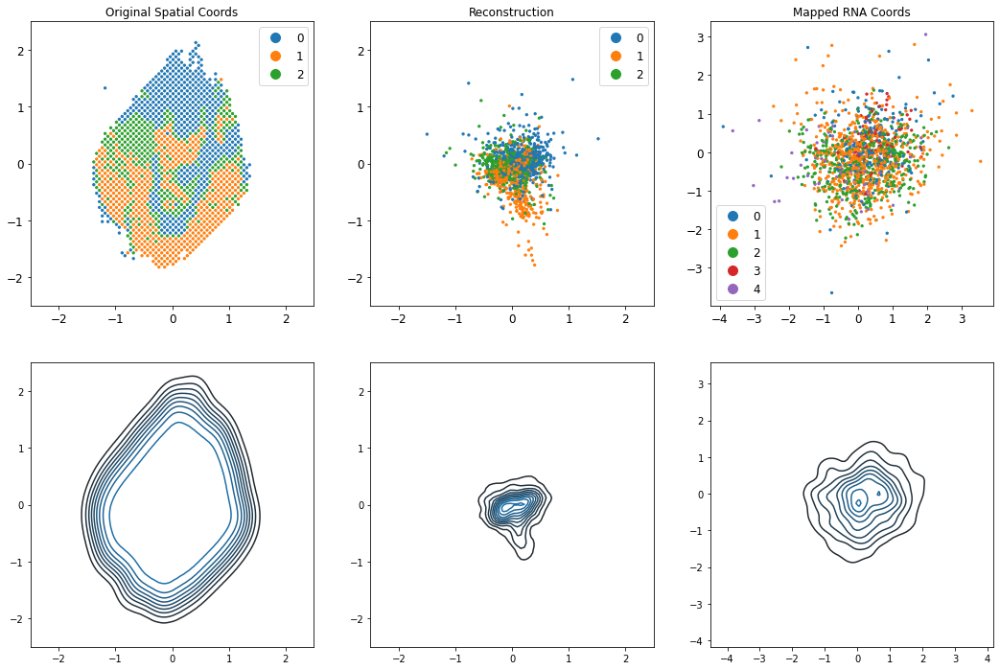

In [52]:
plot_spatial_coords(22, scale=5)

# Model 23

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model23/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model23


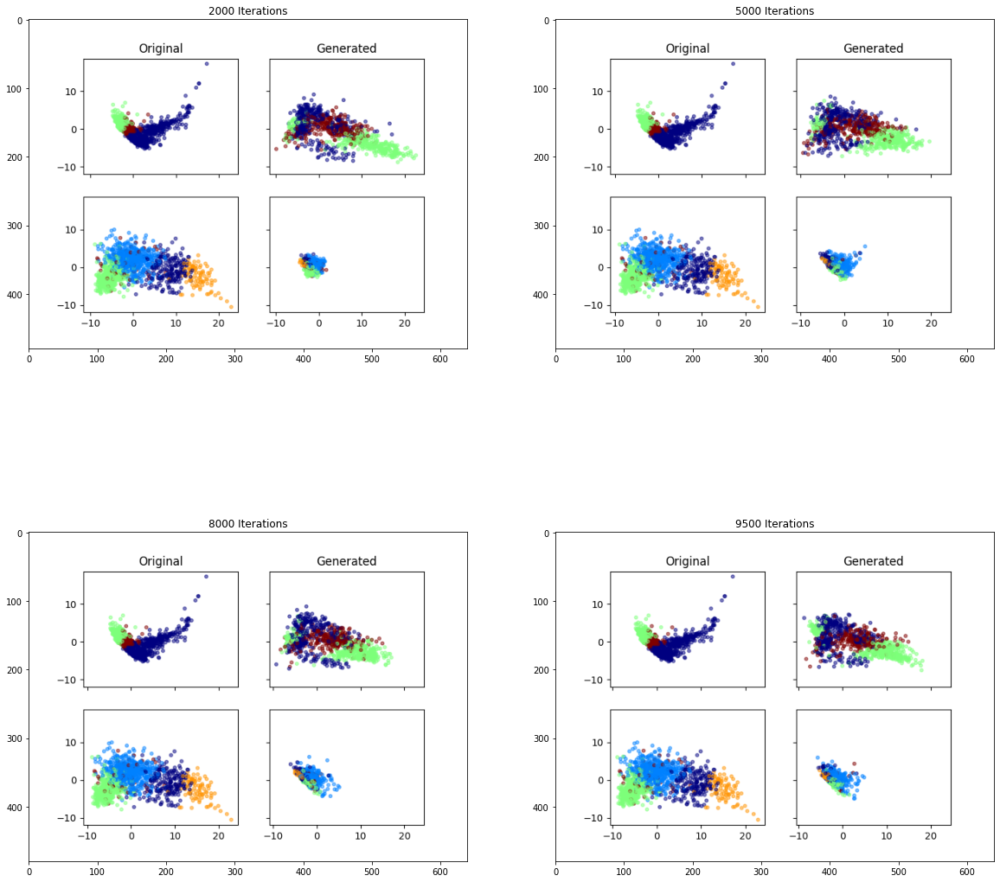

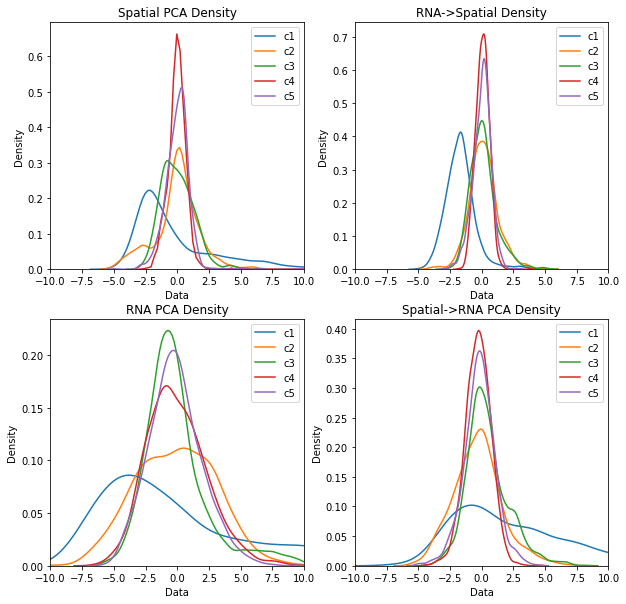

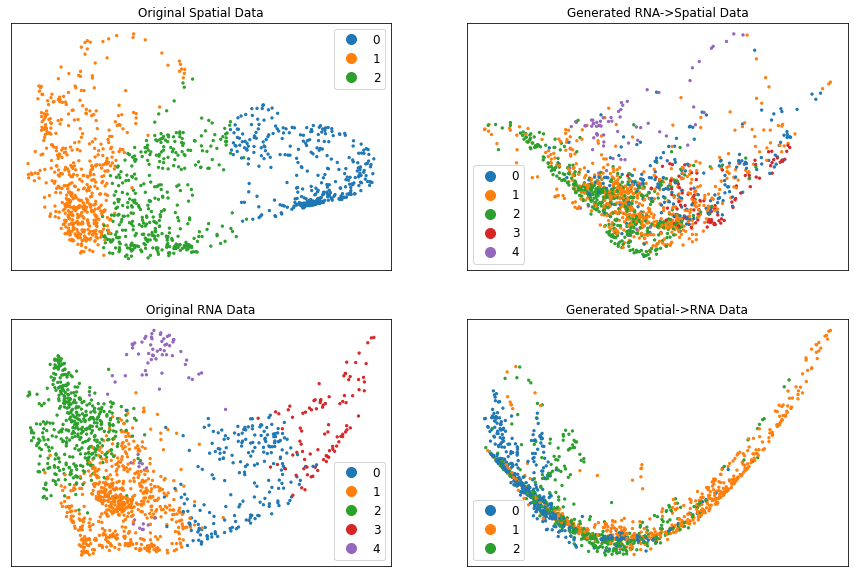

In [20]:
analyze_results(23, [2000, 5000, 8000, 9500])

In [21]:
print_correlations(23, 20)

INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model23/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model23
Correlations using top 20 significant genes
Correlations by cluster by cell
[0.59117407, 0.55626994, 0.5824117]
Correlations by cluster by gene
[0.2921623, 0.27913576, 0.24018443]
Correlations by cluster by cell
[0.7903339, 0.7789178, 0.7816432, 0.783406, 0.7517354]
Correlations by cluster by gene
[0.10500741, 0.14530618, 0.14289278, 0.09544628, 0.15528406]


INFO:tensorflow:Restoring parameters from /home/anniegao/spatial_magan/MAGAN/MAGAN/model23/MAGAN_model_9999
Model restored from /home/anniegao/spatial_magan/MAGAN/MAGAN/model23


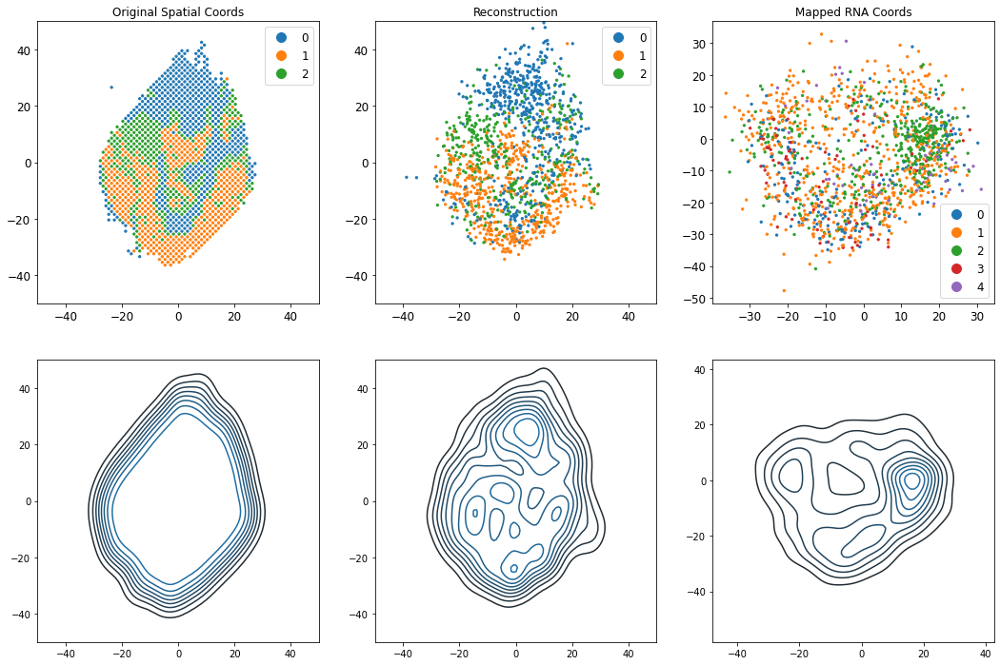

In [53]:
plot_spatial_coords(23, scale=100)